In [1]:
# import basic packages needed in this study

import os
import scipy.io as sio
import pandas as pd
import numpy as np
import pickle as pk
from copy import deepcopy
from scipy.stats import invwishart, multivariate_normal, norm
from scipy.special import logsumexp
from scipy import interpolate

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import r2_score
from sklearn.cluster import KMeans

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

%run HBM_Gibbs_noMissing.py


### Synthesize data

Training data

In [2]:
rand_seed = 202111

N_site = 20
N_site_num = 10

mu0_true = np.array([
    [0, 0], # cluster 1
    [0, 0], # cluster 2
    [0, 0] # cluster 3
])

C0_sig_true =  np.array([
    [1, 1], # cluster 1
    [1, 1], # cluster 2
    [1, 1] # cluster 3
])

C0_rho_true =  np.array([
    0, # cluster 1
    0,  # cluster 2
    0  # cluster 3
])

nu0_true = np.array([8, 8, 8])

Sig0_sig_true =  np.array([
    [1, 1], # cluster 1
    [1, 1], # cluster 2
    [1, 1] # cluster 3
])

Sig0_rho_true =  np.array([
    0.9, # cluster 1
    0,  # cluster 2
    -0.9,  # cluster 3
])


In [3]:
N_dim_true = len(mu0_true[0])
N_c = len(mu0_true)

# assemble C0 and Sig0

C0_true = []
for sig, rho in zip(C0_sig_true, C0_rho_true):
    C0_true.append(np.array([
        [sig[0]**2, sig[0]*sig[1]*rho],
        [sig[0]*sig[1]*rho, sig[1]**2]]))
    
Sig0_true = []
for sig, rho in zip(Sig0_sig_true, Sig0_rho_true):
    Sig0_true.append(5*np.array([
        [sig[0]**2, sig[0]*sig[1]*rho],
        [sig[0]*sig[1]*rho, sig[1]**2]]))

# generate mu, C and data for each site of each cluster
np.random.seed(rand_seed)

mu_true, C_true, x_true = [], [], []
for mu, c0, nu, sig0 in zip(mu0_true, C0_true, nu0_true, Sig0_true):
    mu_true.append(multivariate_normal.rvs(mean=mu, cov=c0, size=N_site))
    C_true.append(invwishart.rvs(df=nu, scale=sig0, size=N_site))
    x_true.append([multivariate_normal.rvs(mean=mu_true[-1][j,:], cov=C_true[-1][j,:,:], size=N_site_num) for j in range(N_site)])
    

In [ ]:
x_train_df = []
for j, val_j in enumerate(x_true):
    for i, val in enumerate(val_j):
        tmp_df = pd.DataFrame(val, index=[f'{j+1}-{i}_{x}' for x in range(val.shape[0])])
        tmp_df['label'] = f'{j+1}-{i}'
        x_train_df.append(deepcopy(tmp_df))

x_train_df = pd.concat(x_train_df, axis=0)

x_train_df


Test data

In [4]:
rand_seed_test = 20211100

N_site_test = 5
N_site_num_test = 10


In [5]:
# generate mu, C and data for each site of each cluster
np.random.seed(rand_seed_test)

mu_test, C_test, x_test = [], [], []
for i, mu in enumerate(mu0_true):
    mu_test.append(multivariate_normal.rvs(mean=mu, cov=C0_true[i], size=N_site_test))
    C_test.append(invwishart.rvs(df=nu0_true[i], scale=Sig0_true[i], size=N_site_test))
    x_test.append([multivariate_normal.rvs(mean=mu_test[-1][j,:], cov=C_test[-1][j,:,:], size=N_site_num_test) for j in range(N_site_test)])
    

In [6]:
x_test_df = []
for j, val_j in enumerate(x_test):
    for i, val in enumerate(val_j):
        tmp_df = pd.DataFrame(val, index=[f'{j+1}-{i}_{x}' for x in range(val.shape[0])])
        tmp_df['label'] = f'{j+1}-{i}'
        x_test_df.append(deepcopy(tmp_df))

x_test_df = pd.concat(x_test_df, axis=0)

x_test_df


,0,1,label
1-0_0,-1.285850,-0.144506,1-0
1-0_1,-0.839761,-0.320558,1-0
1-0_2,-0.236015,0.485037,1-0
1-0_3,-0.406046,0.503852,1-0
1-0_4,-1.145778,-0.348210,1-0
...,...,...,...
3-4_5,-1.756416,1.351008,3-4
3-4_6,-2.497661,1.993592,3-4
3-4_7,-1.868547,1.231451,3-4
3-4_8,-2.124047,1.935788,3-4


Save data

In [8]:
dir_save_data = f'Data/SynData_Cluster_D{N_dim_true}_Str{rand_seed}_Ste{rand_seed_test}'
x_train_df.to_csv(f'{dir_save_data}/training_2D.csv')
x_test_df.to_csv(f'{dir_save_data}/test_2D.csv')

In [6]:
dir_save_data = f'Data/SynData_Cluster_D{N_dim_true}_Str{rand_seed}_Ste{rand_seed_test}'
os.makedirs(dir_save_data, exist_ok=True)

with open(f'{dir_save_data}/raw_data.pkl', 'wb') as f:
    pk.dump({'mu_train': mu_true, 'C_train': C_true, 'x_train': x_true, 'mu_test': mu_test, 'C_test': C_test, 'x_test': x_test}, f)
    

Extract/calculate mu_s and C_s parameters

In [9]:
%%time

tmp_list = np.array(list(range(N_dim_true)))
col_mu = [f'mu_{x}' for x in tmp_list]
col_sig = [f'sig_{x}' for x in tmp_list]
col_rho = [f'rho_{y}-{x}' for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]]

data_Gauss_true = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site):
        mu = pd.Series(mu_true[j][i,:])
        cov = C_true[j][i,:,:]
        sig = pd.Series(np.sqrt(np.diag(cov)))
        rho = pd.Series([cov[y,x]/sig[y]/sig[x] for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]])
        data_Gauss_true[j] = data_Gauss_true[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))
    
    data_Gauss_true[j].columns = col_mu+col_sig+col_rho

data_Gauss_true

# test data
tmp_list = np.array(list(range(N_dim_true)))
col_mu = [f'mu_{x}' for x in tmp_list]
col_sig = [f'sig_{x}' for x in tmp_list]
col_rho = [f'rho_{y}-{x}' for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]]

data_Gauss_test = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site_test):
        mu = pd.Series(mu_test[j][i,:])
        cov = C_test[j][i,:,:]
        sig = pd.Series(np.sqrt(np.diag(cov)))
        rho = pd.Series([cov[y,x]/sig[y]/sig[x] for i, y in enumerate(tmp_list[1:]) for x in tmp_list[:(i+1)]])
        data_Gauss_test[j] = data_Gauss_test[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))
    
    data_Gauss_test[j].columns = col_mu+col_sig+col_rho


CPU times: user 146 ms, sys: 2.82 ms, total: 149 ms
Wall time: 147 ms


In [10]:
%%time

data_Gauss_true_est = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site):
        target_data = pd.DataFrame(x_true[j][i])
        mu = target_data.mean(axis=0)
        cov = pd.DataFrame(index=target_data.columns, columns=target_data.columns)
        tmp = target_data.cov(min_periods=3)
        cov.loc[:,:] = tmp
        sig = pd.Series(np.sqrt(np.diag(cov)), index=target_data.columns)
        rho = pd.Series([cov.loc[y,x]/sig[y]/sig[x] for i, y in enumerate(target_data.columns.values[1:]) for x in target_data.columns.values[:(i+1)]])
        data_Gauss_true_est[j] = data_Gauss_true_est[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))

    data_Gauss_true_est[j].columns = col_mu+col_sig+col_rho

data_Gauss_true_est

# test data
data_Gauss_test_est = [pd.DataFrame() for _ in range(N_c)]
for j in range(N_c):
    for i in range(N_site_test):
        target_data = pd.DataFrame(x_test[j][i])
        mu = target_data.mean(axis=0)
        cov = pd.DataFrame(index=target_data.columns, columns=target_data.columns)
        tmp = target_data.cov(min_periods=3)
        cov.loc[:,:] = tmp
        sig = pd.Series(np.sqrt(np.diag(cov)), index=target_data.columns)
        rho = pd.Series([cov.loc[y,x]/sig[y]/sig[x] for i, y in enumerate(target_data.columns.values[1:]) for x in target_data.columns.values[:(i+1)]])
        data_Gauss_test_est[j] = data_Gauss_test_est[j].append(deepcopy(pd.Series(np.concatenate([mu, sig, rho]), name=f'{j+1}-{i}')))

    data_Gauss_test_est[j].columns = col_mu+col_sig+col_rho


CPU times: user 253 ms, sys: 5.85 ms, total: 259 ms
Wall time: 255 ms


Plot mu_s and C_s distributions

CPU times: user 13 s, sys: 174 ms, total: 13.2 s
Wall time: 6.97 s


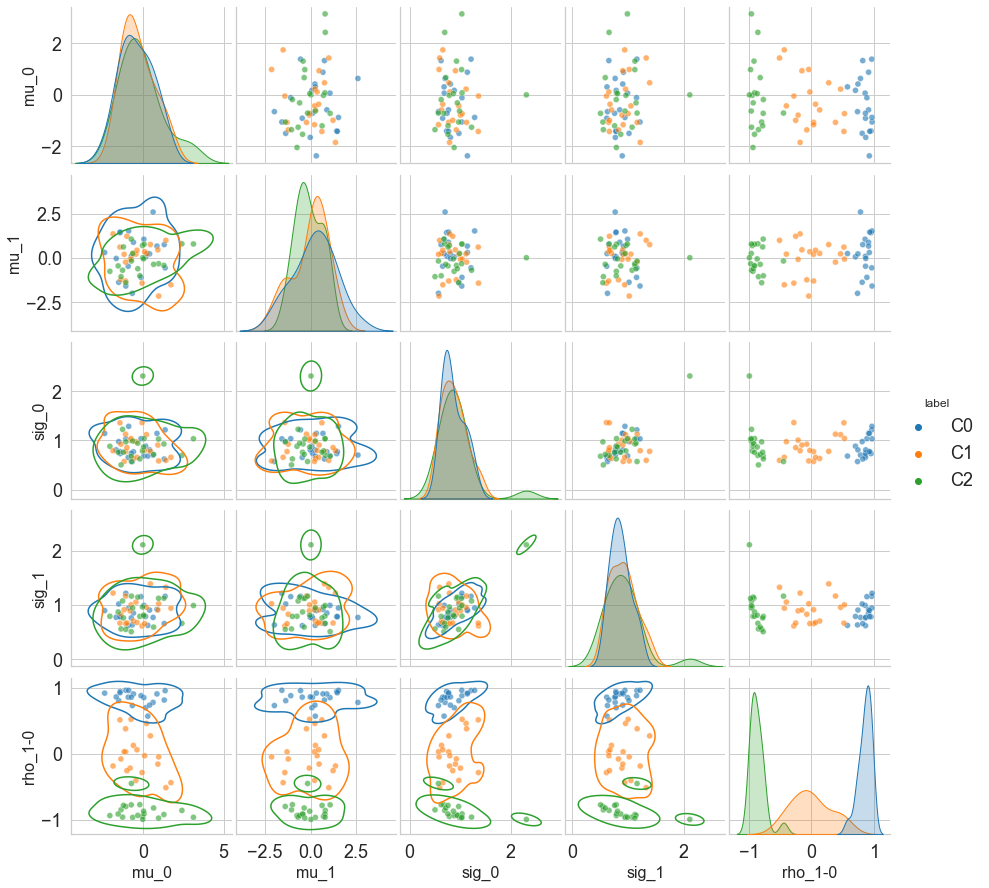

In [12]:
%%time

# distribution of the sampled site mu_s and C_s for training sites

v_alpha = 0.6

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_true
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_train.png', dpi=500)


CPU times: user 13.2 s, sys: 77.8 ms, total: 13.2 s
Wall time: 6.88 s


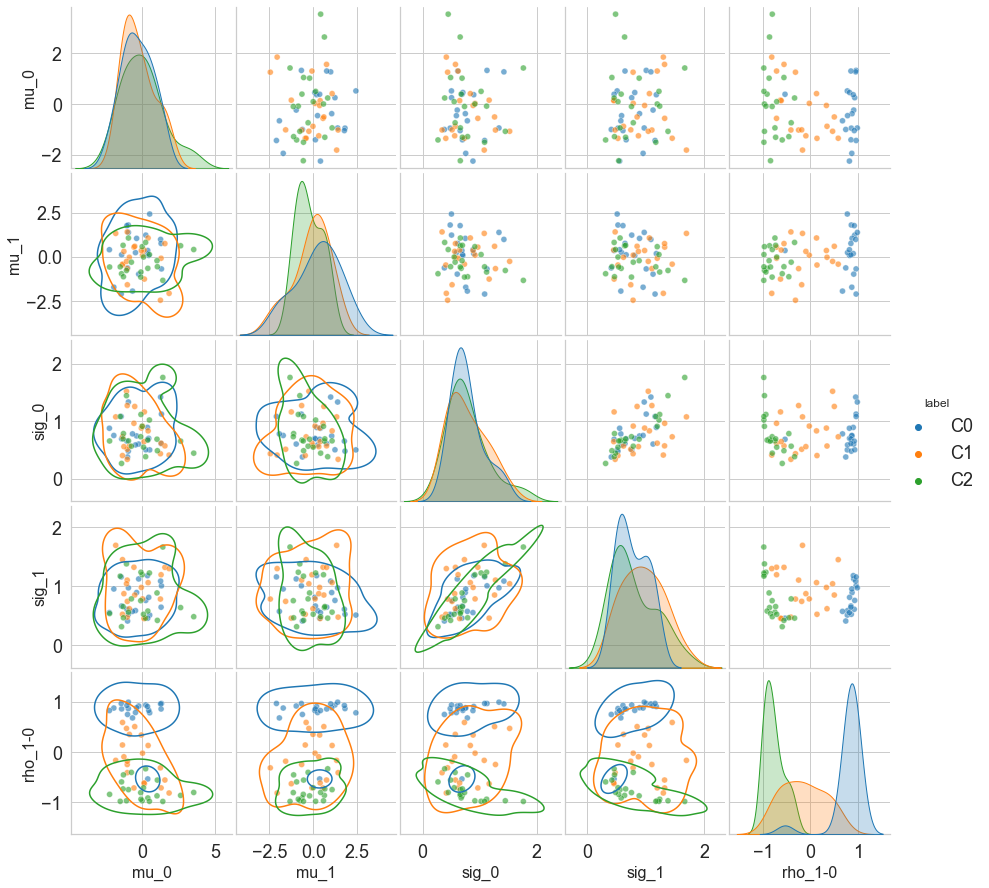

In [15]:
%%time

# distribution of the estimated site mu_s and C_s based on the 10 sampled data in each site (training sites)

v_alpha = 0.6

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_true_est
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_train_est.png', dpi=500)


CPU times: user 12.5 s, sys: 132 ms, total: 12.7 s
Wall time: 7.17 s


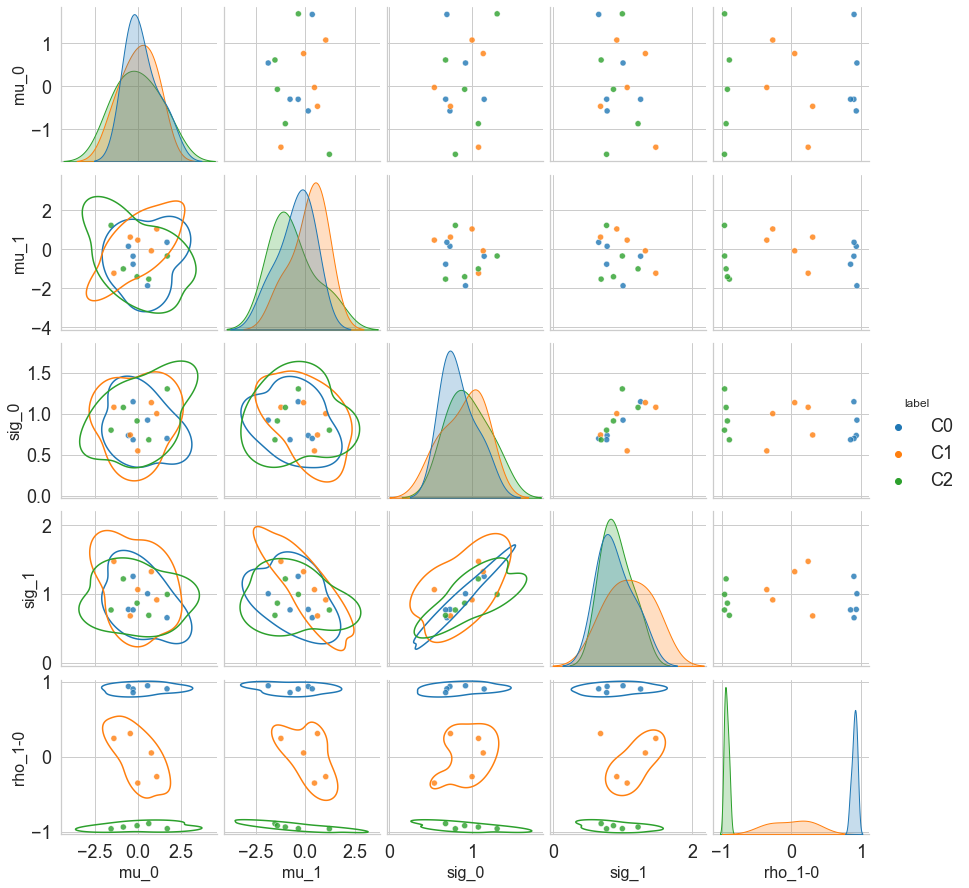

In [16]:
%%time

# distribution of the sampled site mu_s and C_s for test sites

v_alpha = 0.8

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_test
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_test.png', dpi=500)


CPU times: user 12.4 s, sys: 92.1 ms, total: 12.5 s
Wall time: 7.13 s


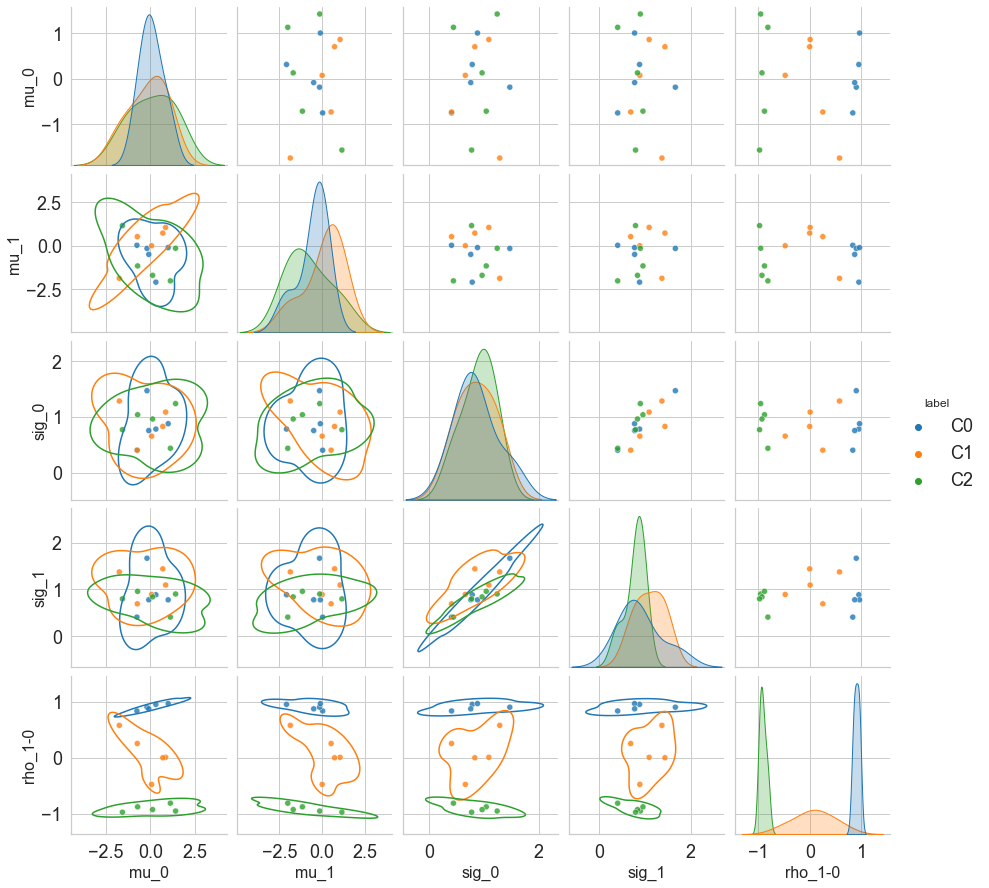

In [17]:
%%time

# distribution of the estimated site mu_s and C_s based on the 10 sampled data in each site (test sites)

v_alpha = 0.8

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

val_s = data_Gauss_test_est
tmp_plot_df = []
for key, tmp_df in enumerate(val_s):
    tmp_df['label'] = f'C{key}'
    tmp_plot_df.append(deepcopy(tmp_df))
tmp_plot_df = pd.concat(tmp_plot_df, axis=0)
tmp_color = sns.color_palette("tab10")[:len(val_s)]

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid") 
# sns.set_style("ticks", {"xtick.major.size":8, "ytick.major.size":8})

sns_plot = sns.pairplot(tmp_plot_df, diag_kind="kde", hue='label', 
                     palette=tmp_color, plot_kws={'alpha': v_alpha})
sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
sns_plot.savefig(f'{dir_plot}/original_test_est.png', dpi=500)


Plot correlation values of the 15 test sites


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


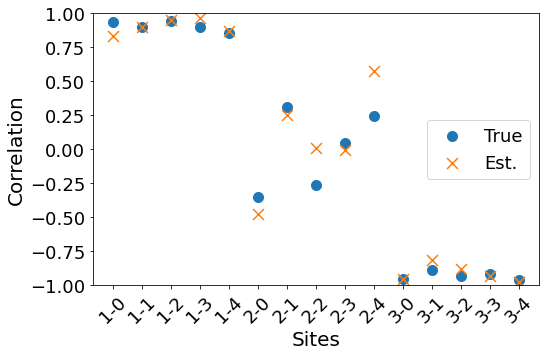

In [20]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

tmp_plot = pd.concat([pd.concat(data_Gauss_test)['rho_1-0'].rename('rho_1-0_true'), pd.concat(data_Gauss_test_est)['rho_1-0']], axis=1)

c_list = sns.color_palette("tab10")[:2]

_ = plt.figure(figsize=(8, 5))
_ = plt.scatter(tmp_plot.index.values, tmp_plot['rho_1-0_true'].values, s=100, c=c_list[0], label='True')
_ = plt.scatter(tmp_plot.index.values, tmp_plot['rho_1-0'].values, s=120, c=c_list[1], marker = 'x', label='Est.')
        
_ =plt.legend(loc='center right', fontsize=18)
_ =plt.ylim([-1, 1])
_ =plt.xticks(fontsize=18, rotation=45)
_ =plt.yticks(fontsize=18)
_ =plt.xlabel('Sites', fontsize=20)
_ =plt.ylabel('Correlation', fontsize=20)
_ =plt.savefig(f'{dir_plot}/Site_rhos.png', dpi=500)


Plot data and site distribution of a specific test site

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

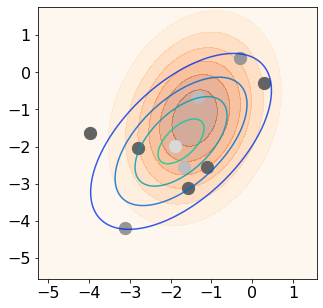

In [92]:
site_plot = '2-4' # pick a site
N_grid = 100
n = 1000
data_idx =[[0], [2, 4], [6, 8], [1, 3, 5, 7, 9]]
dot_size=150

site_plot_id = [int(x) for x in site_plot.split('-')]
c_list = sns.color_palette("tab20c")[-len(data_idx):][::-1]

target_data = x_test_df.loc[x_test_df.label == site_plot, :].drop('label', axis=1).values
x_max = target_data.max(axis=0)
x_min = target_data.min(axis=0)
x_del = x_max - x_min
xy_max = (x_max + x_del*0.3)
xy_min = (x_min - x_del*0.3)
X = np.linspace(xy_min[0], xy_max[0], N_grid)
Y = np.linspace(xy_min[1], xy_max[1], N_grid)
X, Y = np.meshgrid(X, Y)
pos  = np.dstack((X, Y))

rv = multivariate_normal(mu_test[site_plot_id[0]-1][site_plot_id[1]], C_test[site_plot_id[0]-1][site_plot_id[1]])
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
_ = ax.contourf(X, Y, rv.pdf(pos), cmap='Oranges', alpha=0.4)

mu = target_data.mean(axis=0)
cov = np.cov(target_data.T)
Z = multivariate_normal.pdf(pos, mean=mu, cov=cov)
_ = ax.contour(X, Y, Z, 4, cmap='winter', alpha=0.8)

# get contour level by probability
# Z_bar = Z / Z.sum()
# Z_mu = multivariate_normal.pdf(mu, mean=mu, cov=cov) / Z.sum()
# t = np.linspace(0, Z_bar.max(), n)
# integral = ((Z_bar >= t[:, None, None]) * Z_bar).sum(axis=(1,2))
# f = interpolate.interp1d(integral, t)
# t_contours = f(np.array([0.1]))
# _ = ax.contour(X, Y, Z, t_contours, colors='b')

for iD, idx in enumerate(data_idx):
    _ = ax.scatter(target_data[idx,0], target_data[idx,1], s=dot_size, c=c_list[iD])
    
_ = plt.xticks(fontsize= 16)
_ = plt.yticks(fontsize= 16)
plt.savefig(f'{dir_plot}/Test_site_{site_plot}.png', dpi=500)


### Clustering

Cluster with rho only

In [18]:
case_name = 'RhoOnly'

nS = 5 # number of random initiation for K-Means for sensitivity test
nC_list = [2,3,4] # list of number of clusters to try
rand_seed = 202111 # fix random seed for reproducibility
tmp_df = deepcopy(data_Gauss_true_est)

cols = [x for x in tmp_df[0].columns.values if 'rho' in x]


##### Clustering

In [19]:
%%time

tmp_df = pd.concat(tmp_df, axis=0)

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2**32-1, size=nS)

for nC in nC_list:
    kmeans = []
    tmp_df_clus = deepcopy(tmp_df)
    for r_seed in rand_seeds:
        kmeans.append(KMeans(n_clusters=nC, random_state=r_seed).fit(tmp_df[cols]))

        tmp_lab = pd.DataFrame(kmeans[-1].labels_, index=tmp_df.index, columns=['kmeans'])
        tmp_lab[f'kmeans_{r_seed}'] = 0
        for ii, valK in tmp_lab['kmeans'].value_counts().reset_index()['index'].iteritems():
            tmp_lab[f'kmeans_{r_seed}'].loc[tmp_lab['kmeans'] == valK] = ii

        tmp_df_clus = pd.concat([tmp_df_clus, tmp_lab.loc[:,[f'kmeans_{r_seed}']]], axis=1)

        tmp_rho = tmp_df_clus.groupby(f'kmeans_{r_seed}').mean().sort_values('rho_1-0', ascending=False).reset_index()
        tmp_map = {val: key for key, val in tmp_rho[f'kmeans_{r_seed}'].iteritems()}
        tmp_df_clus[f'kmeans_sorted_{r_seed}'] = tmp_df_clus[f'kmeans_{r_seed}'].map(tmp_map)

    tmp_df_clus.to_csv(f'{dir_save_data}/Kmeans_{case_name}_K{nC}.csv')


/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documenta

CPU times: user 408 ms, sys: 13.1 ms, total: 421 ms
Wall time: 415 ms


/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documenta

##### plot clusters

CPU times: user 3min 37s, sys: 2.7 s, total: 3min 40s
Wall time: 1min 53s


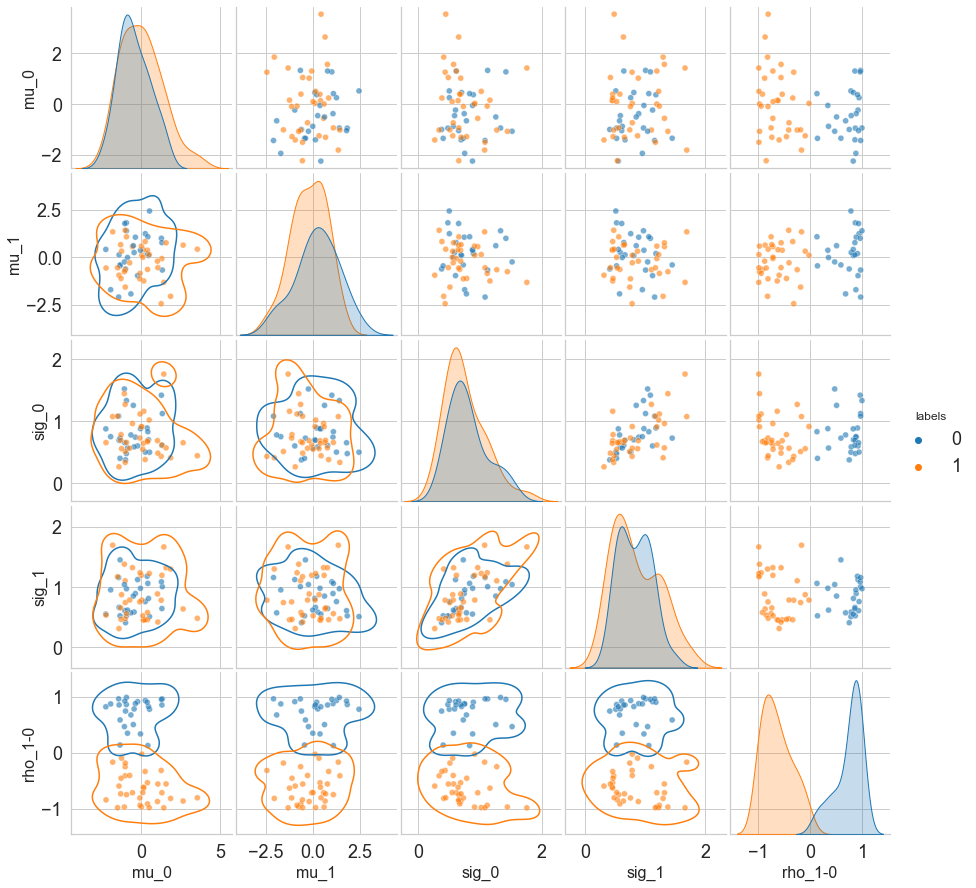

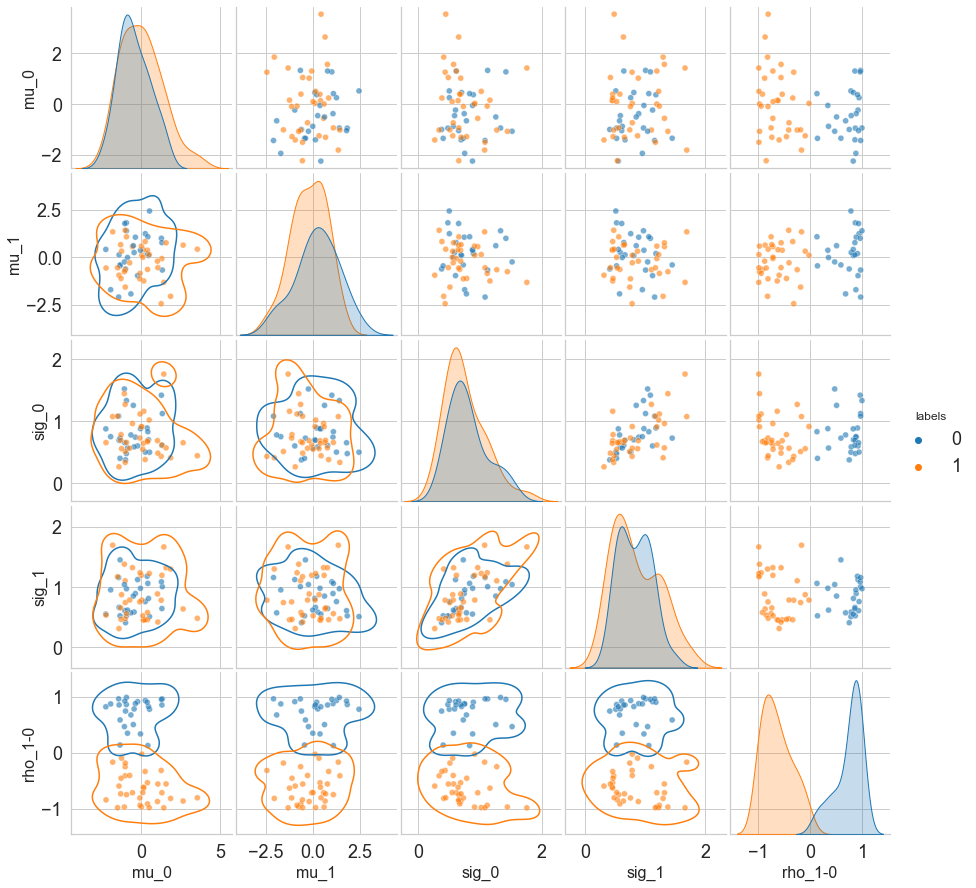

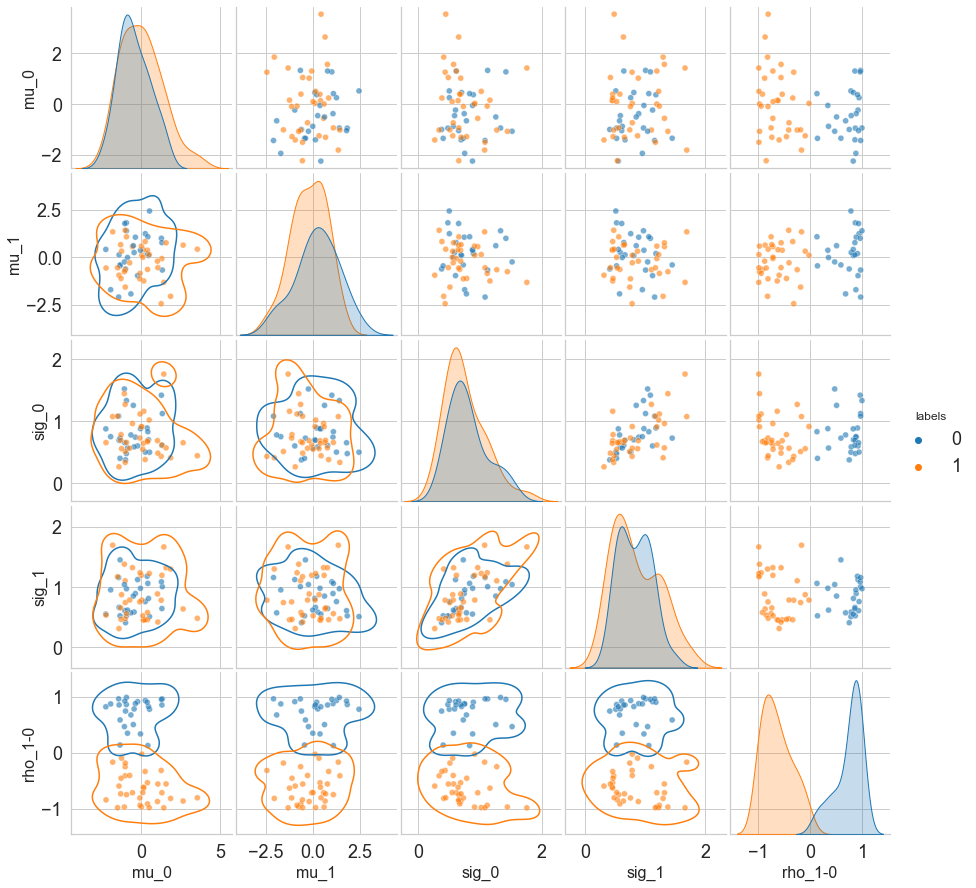

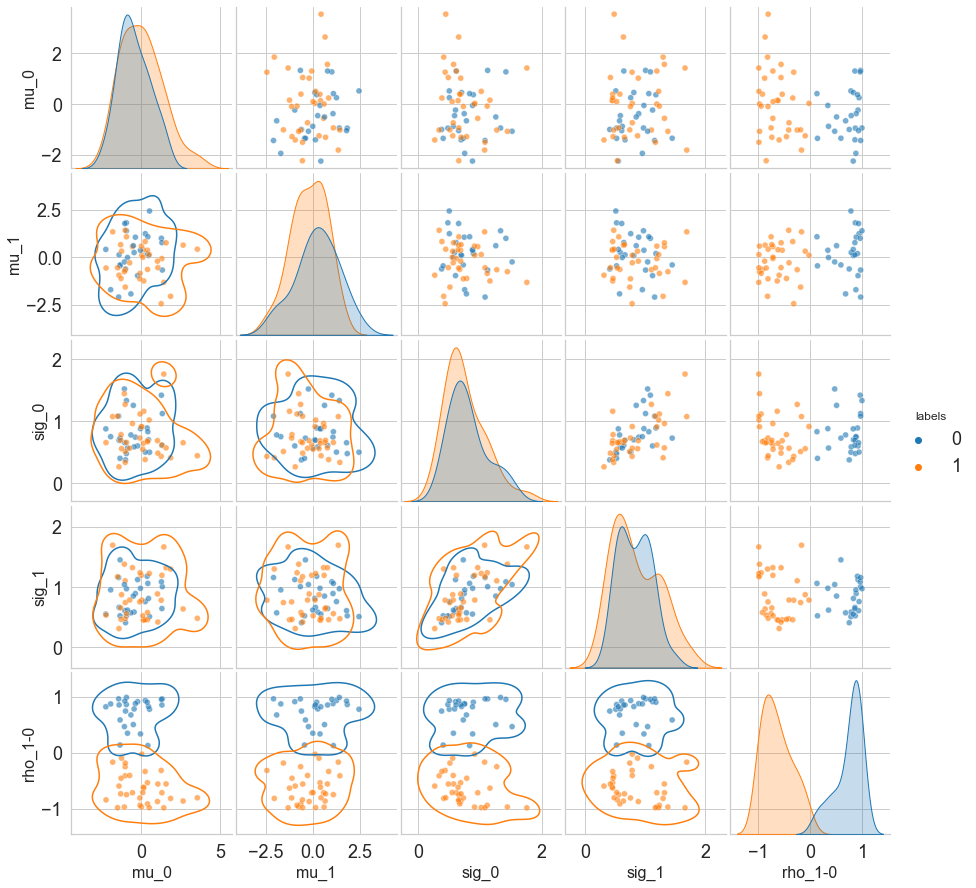

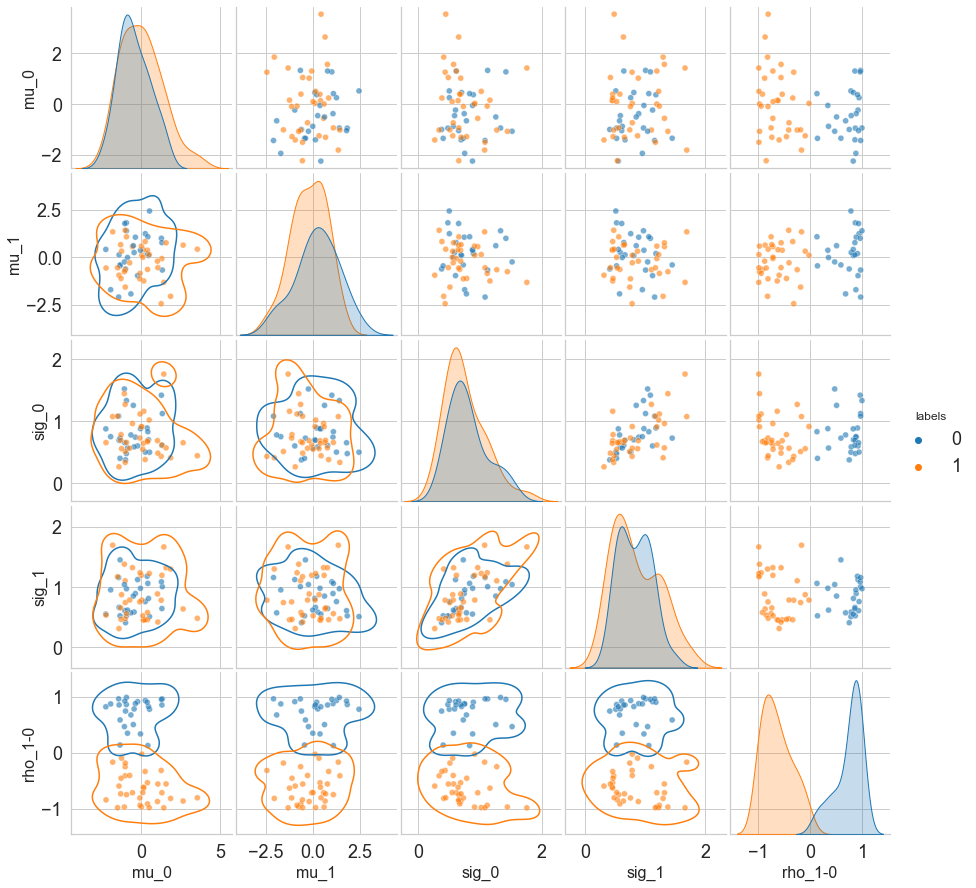

...

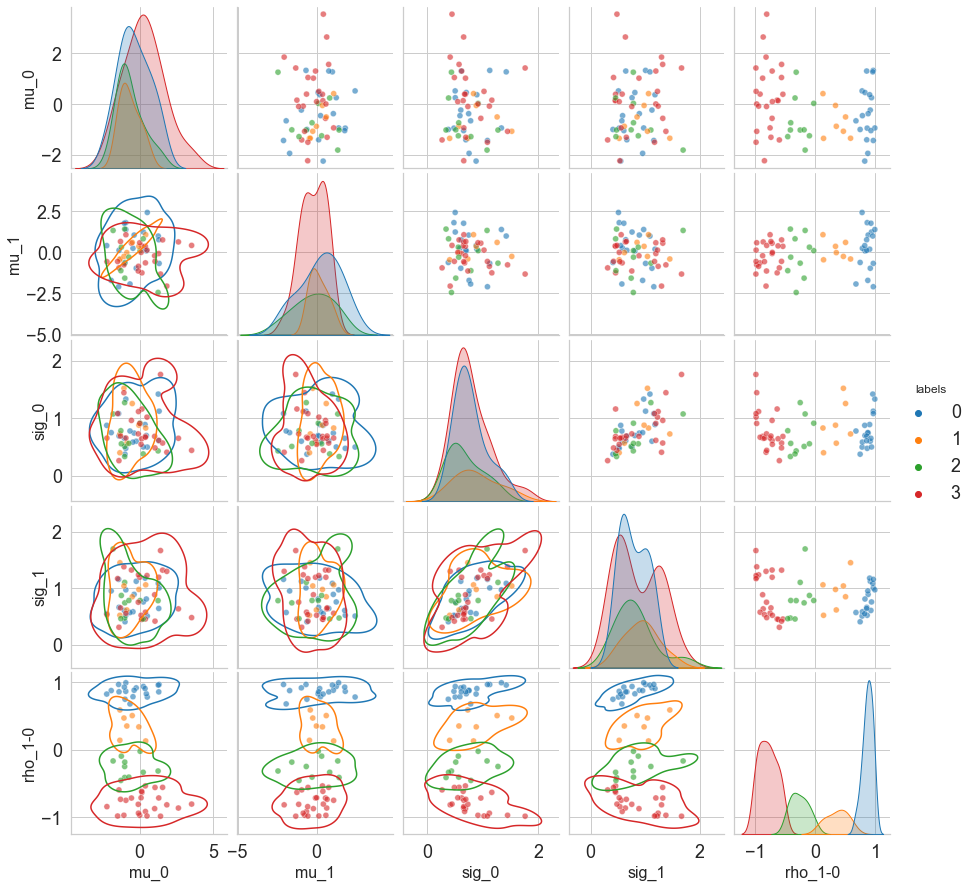

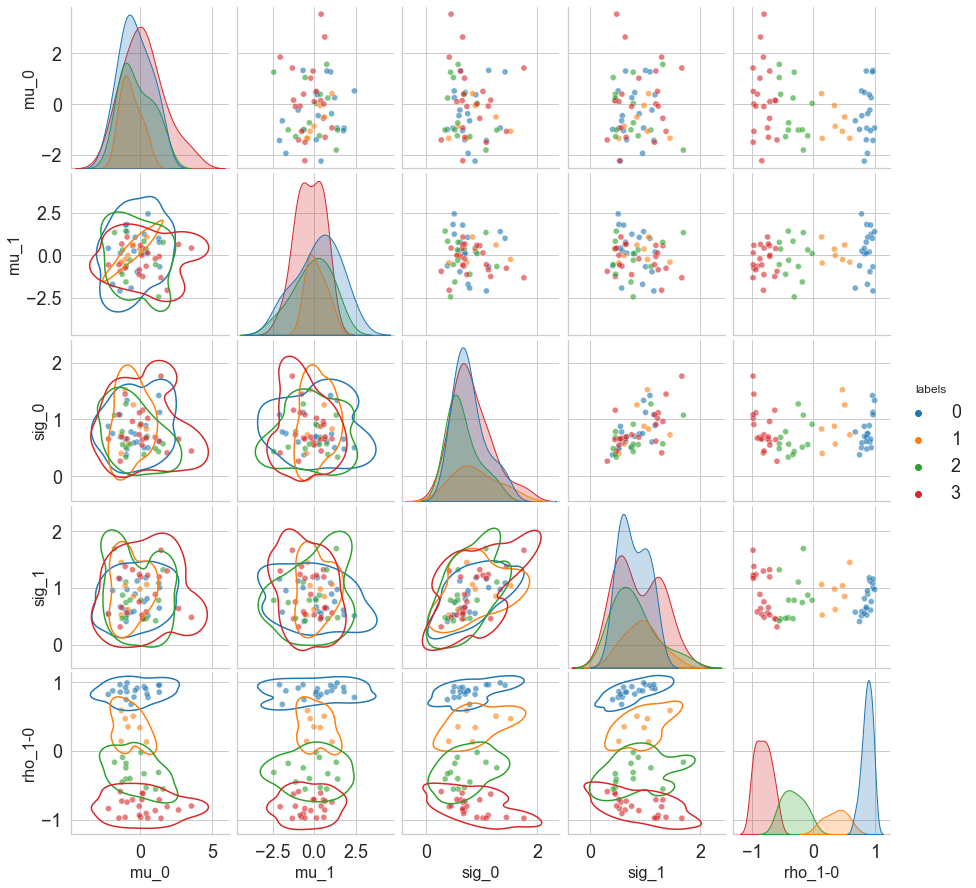

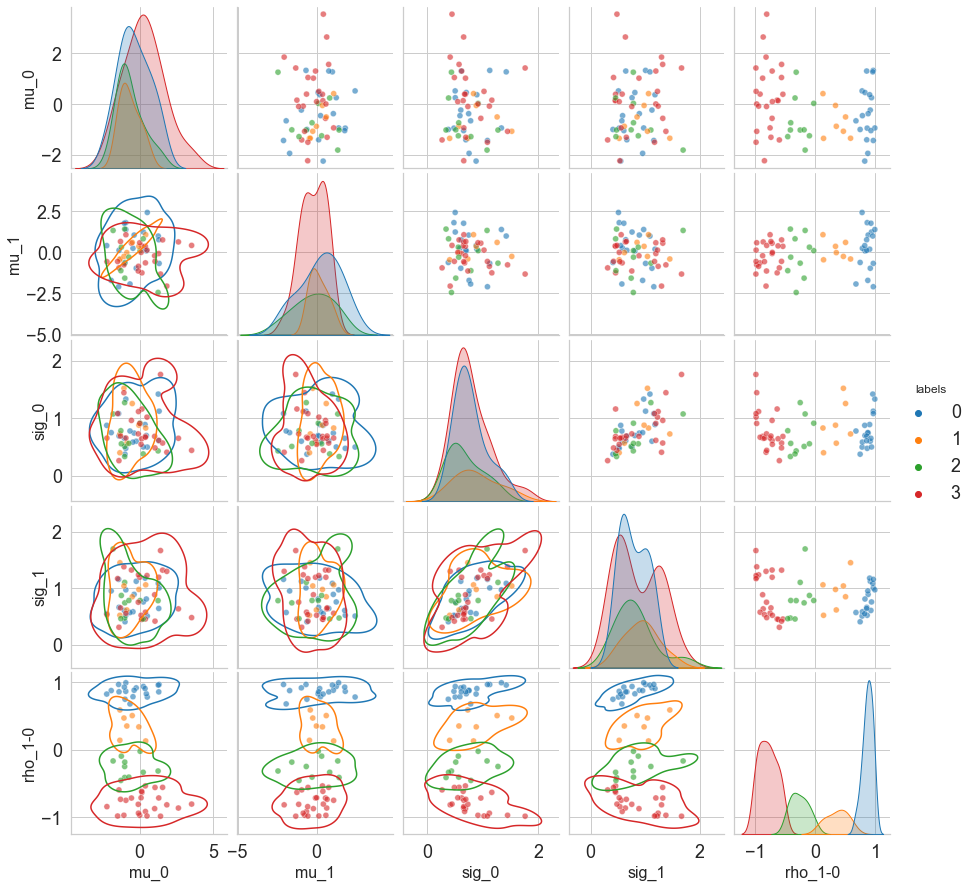

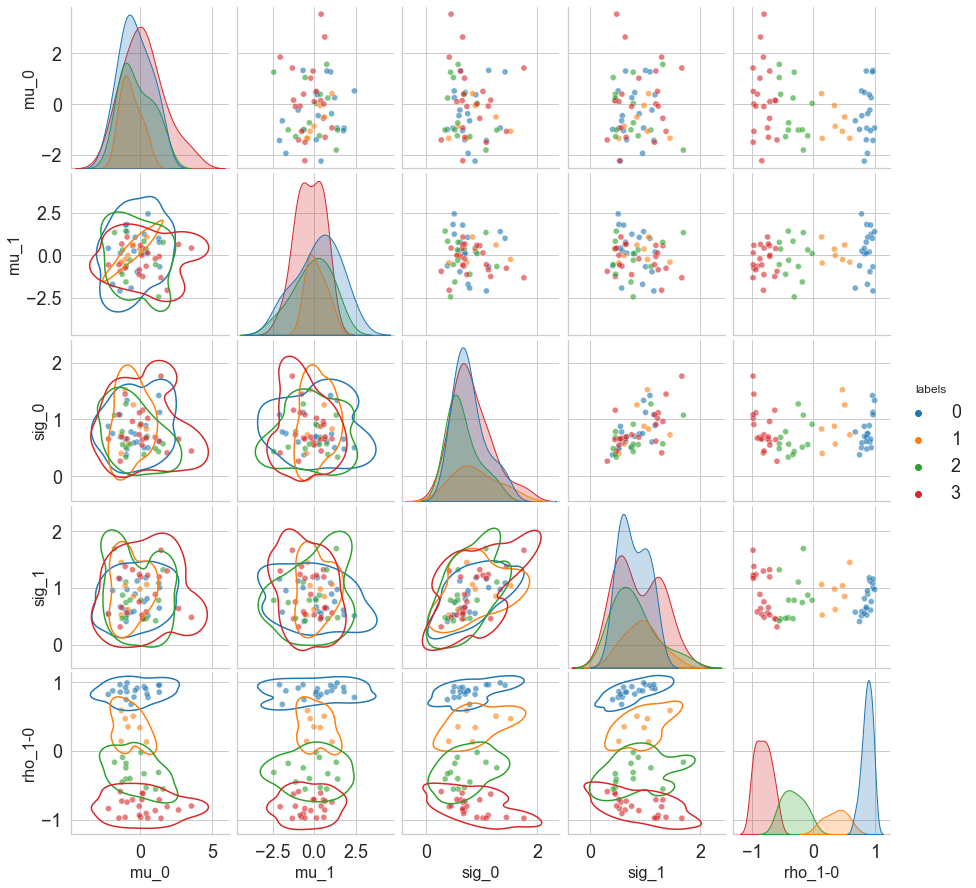

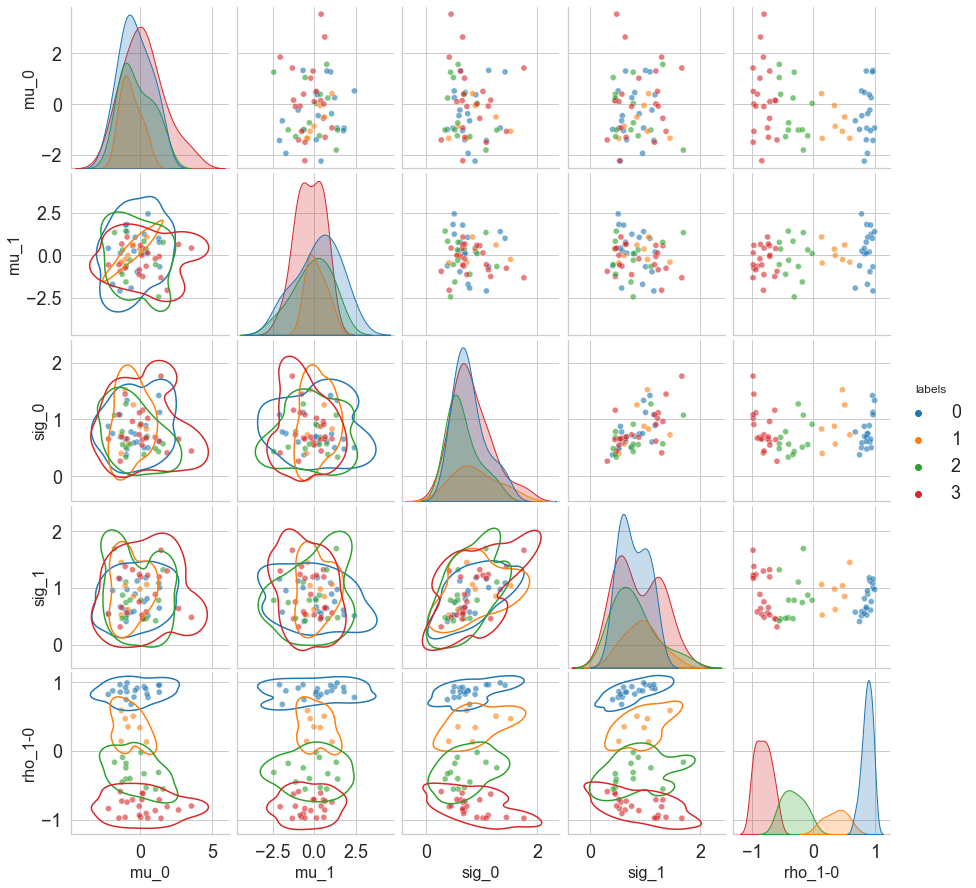

In [24]:
%%time

for nC in nC_list:
    tmp_df_clus = pd.read_csv(f'{dir_save_data}/Kmeans_{case_name}_K{nC}.csv')
    
    val_alpha = 0.6
    c_list = sns.color_palette("tab10")[:nC]

    dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}/Unsupervised_clustering/{case_name}_K{nC}'
    os.makedirs(dir_plot, exist_ok=True)

    tmp_labs = [x for x in tmp_df_clus.columns.values if 'kmeans_sorted' in x]
    tmp_cols = [x for x in tmp_df_clus.columns.values if 'kmeans_' not in x]
    for i_lab in tmp_labs:
        ii = i_lab.split('_')[-1]

        sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
        'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
        sns.set_style("whitegrid")

        tmptmp = tmp_df_clus[tmp_cols+[i_lab]]
        tmptmp

        sns_plot = sns.pairplot(tmp_df_clus[tmp_cols+[i_lab]].rename({i_lab: 'labels'}, axis=1), diag_kind="kde", hue='labels', 
                         palette=c_list, plot_kws={'alpha': val_alpha})
        sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
        sns_plot.savefig(f'{dir_plot}/Seed_{ii}.png', dpi=500)
    

### HBM Gibbs

Manually load clustering results from K = 2, 3, 4 due to long computation time for each case

In [30]:
nC = 4
tmp_df_clus = pd.read_csv(f'Data/SynData_Cluster_D2_Str202111_Ste20211100/Kmeans_RhoOnly_K{nC}.csv', index_col=0)
tmp_df_clus


,mu_0,mu_1,sig_0,sig_1,rho_1-0,kmeans_232152043,kmeans_sorted_232152043,kmeans_2963327645,kmeans_sorted_2963327645,kmeans_455304649,kmeans_sorted_455304649,kmeans_2043807785,kmeans_sorted_2043807785,kmeans_6803724,kmeans_sorted_6803724
1-0,0.525845,2.428664,0.502540,0.511784,0.781827,1,0,1,0,1,0,1,0,1,0
1-1,1.333238,-0.677428,1.124982,1.008175,0.967124,1,0,1,0,1,0,1,0,1,0
1-2,-0.938639,1.806967,0.480418,0.525296,0.866249,1,0,1,0,1,0,1,0,1,0
1-3,-0.991810,-0.619859,0.379078,0.410834,0.749231,1,0,1,0,1,0,1,0,1,0
1-4,0.258854,1.235457,0.504275,0.760654,0.938148,1,0,1,0,1,0,1,0,1,0
1-5,-0.227562,-0.971868,0.604038,1.125003,0.917595,1,0,1,0,1,0,1,0,1,0
1-6,-0.369585,1.051248,0.745309,0.894060,0.882261,1,0,1,0,1,0,1,0,1,0
1-7,1.275348,0.991577,1.421168,1.088542,0.959261,1,0,1,0,1,0,1,0,1,0
1-8,0.462238,0.088011,0.702617,0.812598,0.829645,1,0,1,0,1,0,1,0,1,0
1-9,-1.931253,-1.712288,0.753040,0.954732,0.877013,1,0,1,0,1,0,1,0,1,0


Pick up specific cluster and prepare data for HBM-Gibbs on each cluster

In [31]:
HBM_seed = 202111
selected_seed = 6803724
col = f'kmeans_sorted_{selected_seed}'

n_repeat = 1

x_cluster = {}
for s in tmp_df_clus[col].unique():
    tmp_idx = tmp_df_clus.index[tmp_df_clus[col] == s].values
    x_cluster[s] = []
    for i1, i2 in [x.split('-') for x in tmp_idx]:
        for _ in range(n_repeat):
            x_cluster[s].append(deepcopy(x_true[int(i1)-1][int(i2)]))


Run HBM-Gibbs on each cluster to get hyperparameter samples

In [32]:
%%time

np.random.seed(HBM_seed)

mu_s, C_s, mu_0, C_0, Sig_0, nu_0, a_k = {}, {}, {}, {}, {}, {}, {}
for key, val in x_cluster.items():
        mu_s[key], C_s[key], mu_0[key], C_0[key], Sig_0[key], nu_0[key], a_k[key] = hbm_gibbs_nomissing(val)
        print(f'{key} done')
        

0 done
2 done
1 done
3 done
CPU times: user 6min 2s, sys: 1.04 s, total: 6min 3s
Wall time: 6min 3s


Save results

In [33]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_K{nC}_Sk{selected_seed}_S{HBM_seed}_N{n_repeat}.pkl', 'wb') as f:
    pk.dump({'mu_s': mu_s, 'C_s': C_s, 'mu_0': mu_0, 'C_0': C_0, 'Sig_0': Sig_0, 'nu_0': nu_0, 'a_k': a_k}, f)
    

Re-do the process for the global case (all training sites used in HBM-Gibbs)

In [65]:
HBM_seed = 202111

x_cluster = {'All': np.concatenate(x_true)}


In [66]:
%%time

np.random.seed(HBM_seed)

mu_s, C_s, mu_0, C_0, Sig_0, nu_0, a_k = {}, {}, {}, {}, {}, {}, {}
for key, val in x_cluster.items():
        mu_s[key], C_s[key], mu_0[key], C_0[key], Sig_0[key], nu_0[key], a_k[key] = hbm_gibbs_nomissing(val)
        print(f'{key} done')
        

All done
CPU times: user 4min 18s, sys: 160 ms, total: 4min 18s
Wall time: 4min 18s


In [67]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_All_S{HBM_seed}.pkl', 'wb') as f:
    pk.dump({'mu_s': mu_s, 'C_s': C_s, 'mu_0': mu_0, 'C_0': C_0, 'Sig_0': Sig_0, 'nu_0': nu_0, 'a_k': a_k}, f)
    

##### Plot fitting

Get mu_s and C_s parameters for HBM-Clus results

In [35]:
%%time

dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'
nC_list = [2, 3, 4]
rand_seed = 202111

# prediction sampling parameters
N_burn = 1000
del_t = 10
N_i = 1

data_Gauss = {}
for nC in nC_list:
    # load posterior hyperparameter samples
    with open(f'{dir_save_data}/HBM_Gibbs_K{nC}_Sk6803724_S202111_N1.pkl', 'rb') as f:
        tmp = pk.load(f)

    mu_s = tmp['mu_s']
    C_s = tmp['C_s']
    mu_0 = tmp['mu_0']
    C_0 = tmp['C_0']
    Sig_0 = tmp['Sig_0']
    nu_0 = tmp['nu_0']
    a_k = tmp['a_k']
    
    Nt = mu_0[list(mu_0.keys())[0]].shape[1]
    N_psi = len(list(range(N_burn, Nt, del_t)))
    Ndim = x_cluster[list(x_cluster.keys())[0]][0].shape[1]

    col_mu = [f'mu_{x}' for x in range(Ndim)]
    col_sig = [f'sig_{x}' for x in range(Ndim)]
    col_rho = [f'rho_{y}{x}' for y in range(1, Ndim) for x in range(y)]

    np.random.seed(rand_seed)
    rand_seeds = np.random.randint(0, 2**32-1, size=N_psi)
    
    data_Gauss[f'K{nC}'] = {}
    for key in mu_0.keys():
        if N_i == 1:
            data_Mu = np.zeros([Ndim, N_psi])
            data_Sigma = np.zeros([Ndim, Ndim, N_psi])

            for ii, iS in enumerate(range(N_burn, Nt, del_t)):
                data_Mu[:, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], random_state=rand_seeds[ii]).T
                data_Sigma[:, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], random_state=rand_seeds[ii]).T
        else:
            data_Mu = np.zeros([Ndim, N_i, N_psi])
            data_Sigma = np.zeros([Ndim, Ndim, N_i, N_psi])

            for ii, iS in enumerate(range(N_burn, Nt, del_t)):
                data_Mu[:, :, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T
                data_Sigma[:, :, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T

        mu = data_Mu[:Ndim,].reshape(Ndim,-1)
        cov = data_Sigma[:Ndim,:Ndim,].reshape(Ndim,Ndim,-1)
        sig = np.sqrt(np.diagonal(cov).T)
        rho = np.vstack([cov[y,x,:]/sig[y,:]/sig[x,:] for y in range(1, Ndim) for x in range(y)])

        data_Gauss[f'K{nC}'][key] = pd.DataFrame(np.concatenate([mu, sig, rho]).T, columns=col_mu+col_sig+col_rho)
    

CPU times: user 10.9 s, sys: 244 ms, total: 11.1 s
Wall time: 11.2 s


Plot mu_s and C_s parameters for HBM-Clus

CPU times: user 4min 15s, sys: 1.65 s, total: 4min 16s
Wall time: 2min 12s


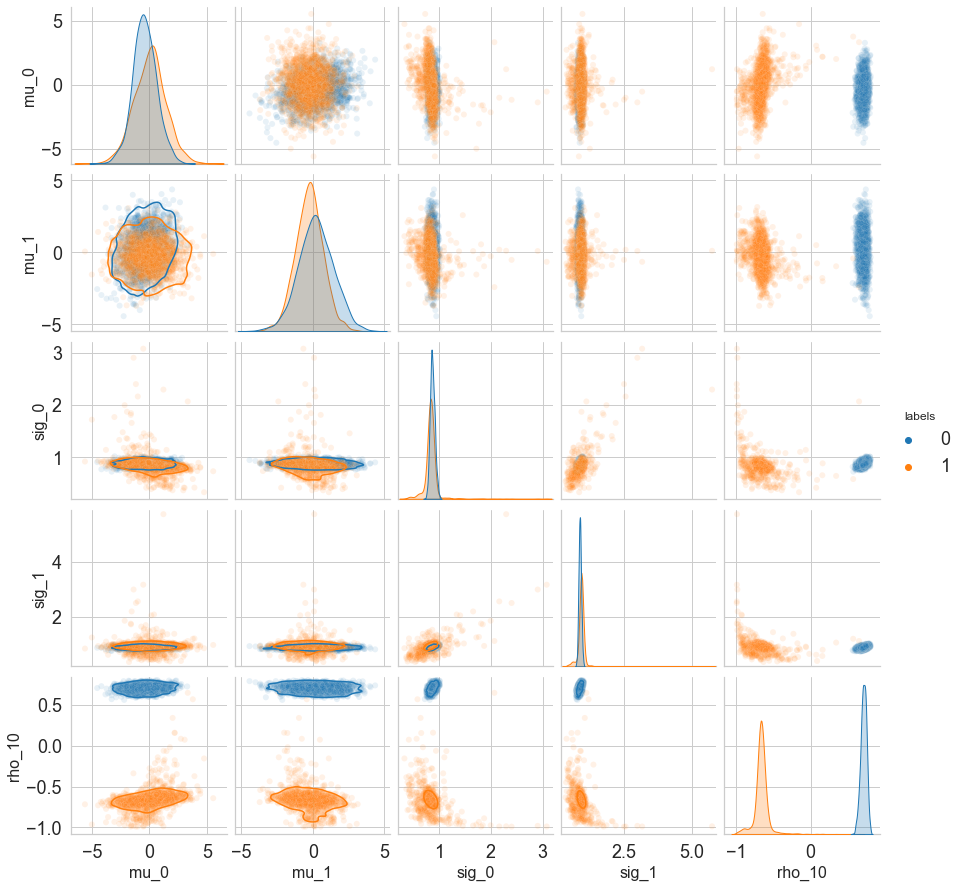

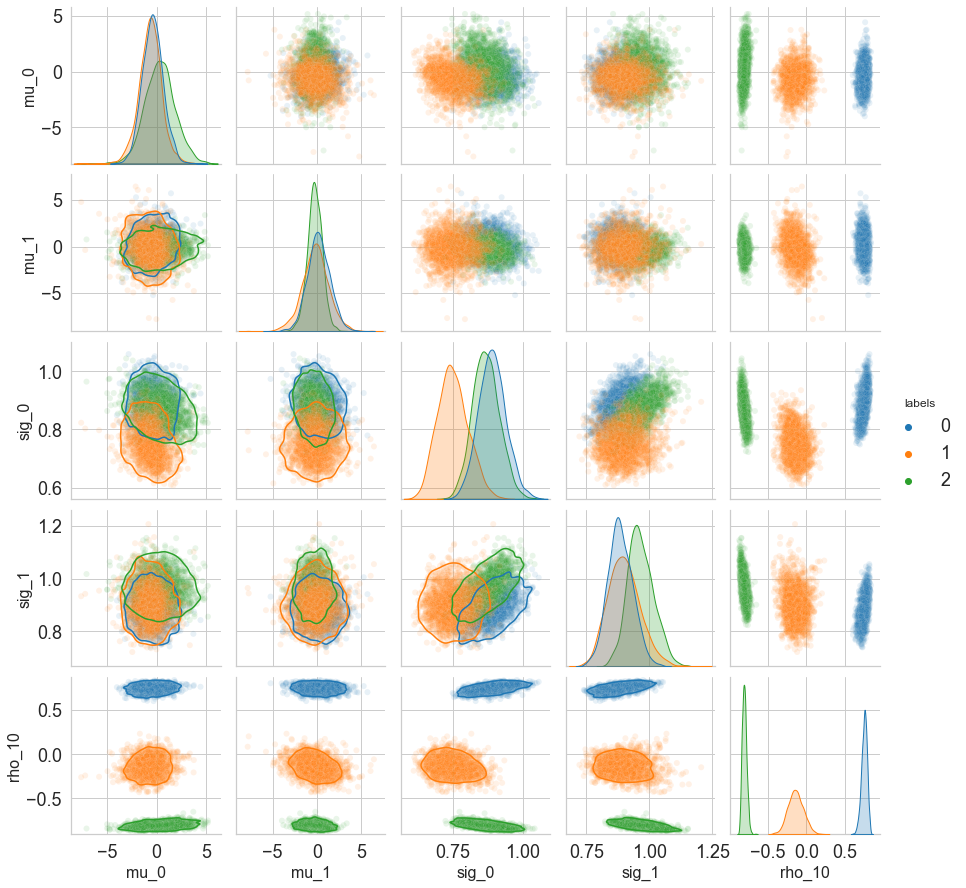

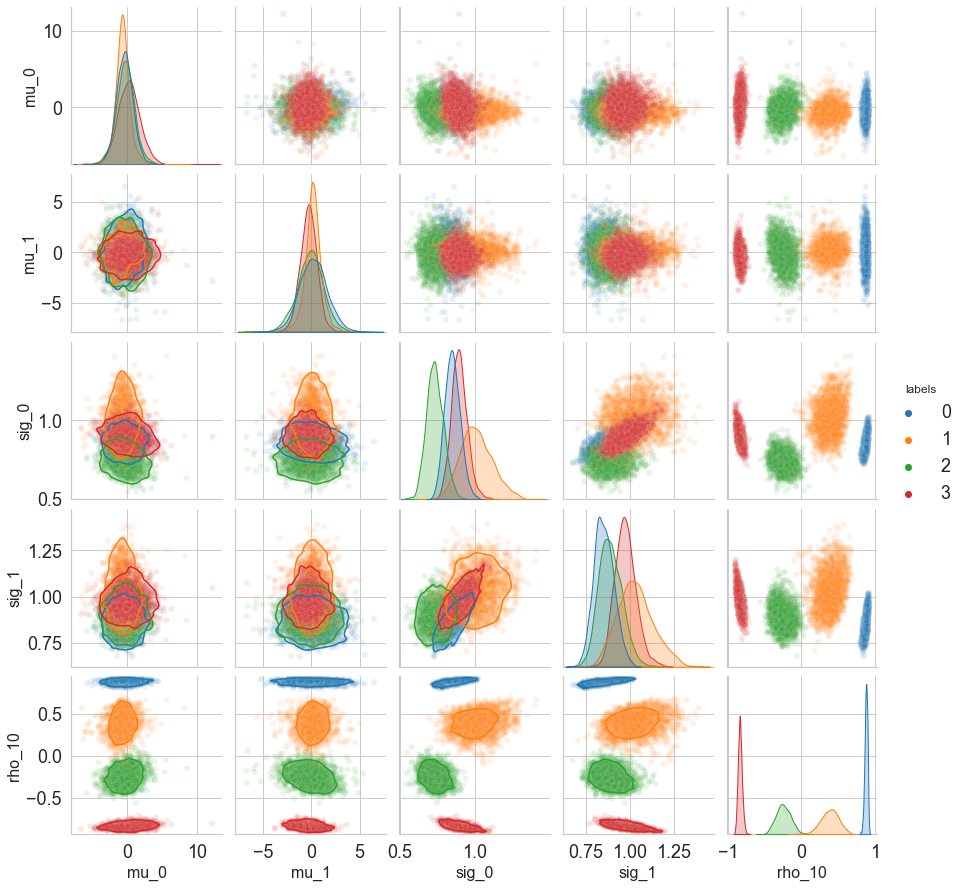

In [36]:
%%time

# plot distribution for all parameters (pairplot)

for nC in nC_list:
    val_alpha = 0.1
    c_list = sns.color_palette("tab10")[:nC]

    dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}/HBM_Gibbs'
    os.makedirs(dir_plot, exist_ok=True)

    tmp_df_clus = []
    for key, val in data_Gauss[f'K{nC}'].items():
        val['labels'] = key
        tmp_df_clus.append(deepcopy(val))
    tmp_df_clus = pd.concat(tmp_df_clus, axis=0)

    sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
        'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
    sns.set_style("whitegrid")

    sns_plot = sns.pairplot(tmp_df_clus, diag_kind="kde", hue='labels', 
                     palette=c_list, plot_kws={'alpha': val_alpha})
    sns_plot.map_lower(sns.kdeplot, levels=2, color=".2")
    sns_plot.savefig(f'{dir_plot}/{case_name}_K{nC}_S{selected_seed}_N{n_repeat}.png', dpi=500)
    

Do the same for HBM-Gibbs (based on all training sites)

In [ ]:
dir_save_data = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save_data}/HBM_Gibbs_All_S202111.pkl', 'rb') as f:
    tmp = pk.load(f)

mu_s = tmp['mu_s']
C_s = tmp['C_s']
mu_0 = tmp['mu_0']
C_0 = tmp['C_0']
Sig_0 = tmp['Sig_0']
nu_0 = tmp['nu_0']
a_k = tmp['a_k']


In [ ]:
%%time

N_burn = 1000
del_t = 10
N_i = 1
Nt = mu_0[list(mu_0.keys())[0]].shape[1]
N_psi = len(list(range(N_burn, Nt, del_t)))
Ndim = x_cluster[list(x_cluster.keys())[0]][0].shape[1]
rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2**32-1, size=N_psi)

col_mu = [f'mu_{x}' for x in range(Ndim)]
col_sig = [f'sig_{x}' for x in range(Ndim)]
col_rho = [f'rho_{y}{x}' for y in range(1, Ndim) for x in range(y)]

data_Gauss = {}
for key in mu_0.keys():
    if N_i == 1:
        data_Mu = np.zeros([Ndim, N_psi])
        data_Sigma = np.zeros([Ndim, Ndim, N_psi])

        for ii, iS in enumerate(range(N_burn, Nt, del_t)):
            data_Mu[:, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], random_state=rand_seeds[ii]).T
            data_Sigma[:, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], random_state=rand_seeds[ii]).T
    else:
        data_Mu = np.zeros([Ndim, N_i, N_psi])
        data_Sigma = np.zeros([Ndim, Ndim, N_i, N_psi])

        for ii, iS in enumerate(range(N_burn, Nt, del_t)):
            data_Mu[:, :, ii] = multivariate_normal.rvs(mean=mu_0[key][:, iS], cov=C_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T
            data_Sigma[:, :, :, ii] = invwishart.rvs(df=nu_0[key][iS], scale=Sig_0[key][:, :, iS], size=N_i, random_state=rand_seeds[ii]).T

    mu = data_Mu[:Ndim,].reshape(Ndim,-1)
    cov = data_Sigma[:Ndim,:Ndim,].reshape(Ndim,Ndim,-1)
    sig = np.sqrt(np.diagonal(cov).T)
    rho = np.vstack([cov[y,x,:]/sig[y,:]/sig[x,:] for y in range(1, Ndim) for x in range(y)])

    data_Gauss[key] = pd.DataFrame(np.concatenate([mu, sig, rho]).T, columns=col_mu+col_sig+col_rho)
    

CPU times: user 29.9 s, sys: 194 ms, total: 30 s
Wall time: 16.2 s


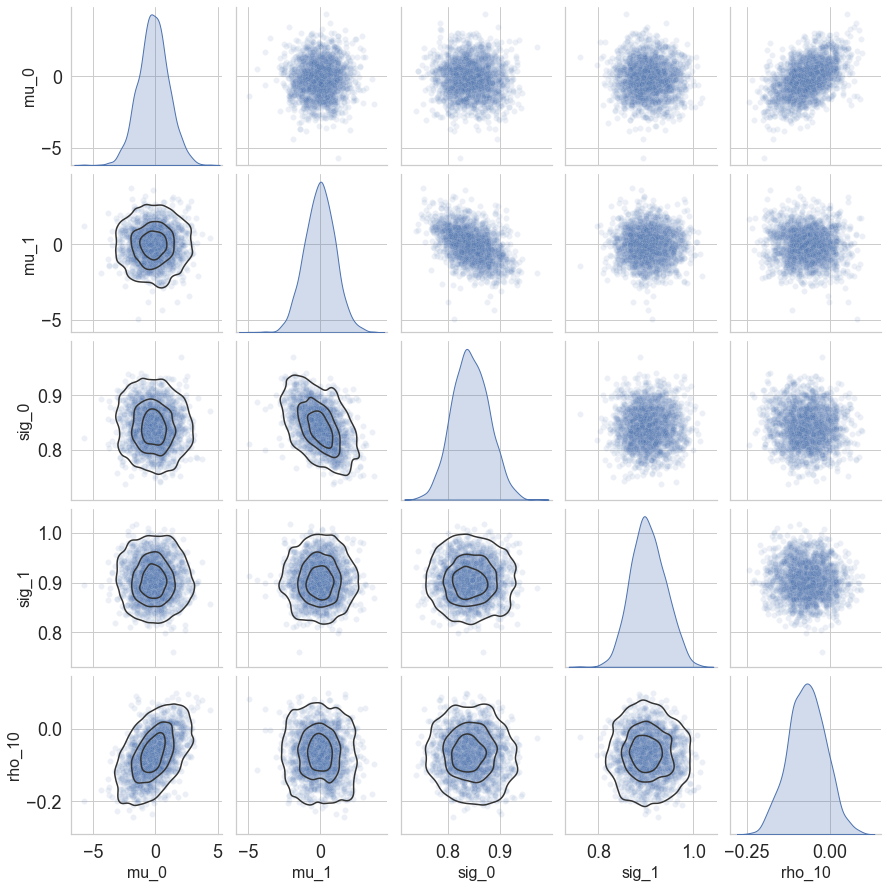

In [70]:
%%time

val_alpha = 0.1
c_list = sns.color_palette("tab10")[0:1]

dir_plot = f'PairPlots/Synthetic_test_Cluster_D{N_dim_true}/HBM_Gibbs'
os.makedirs(dir_plot, exist_ok=True)

tmp_df_clus = []
for key, val in data_Gauss.items():
    tmp_df_clus.append(deepcopy(val))
tmp_df_clus = pd.concat(tmp_df_clus, axis=0)

sns.set(rc={'font.size': 8, 'axes.labelsize': 16, 'legend.fontsize': 18, 
    'axes.titlesize': 8, 'xtick.labelsize': 18, 'ytick.labelsize': 18})
sns.set_style("whitegrid")
    
sns_plot = sns.pairplot(tmp_df_clus, diag_kind="kde", plot_kws={'alpha': val_alpha})
sns_plot.map_lower(sns.kdeplot, levels=4, color=".2")
sns_plot.savefig(f'{dir_plot}/{case_name}_All.png', dpi=500)
    

### Prediction for test data

IMPORTANT: manually set nC = 2, 3, 4 for different number of clusters

Load HBM hyperparameter samples

In [50]:
nC = 4
dir_load = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'
f_all = 'HBM_Gibbs_All_S202111.pkl'
f_cluster = f'HBM_Gibbs_K{nC}_Sk6803724_S202111_N1.pkl'

with open(f'{dir_load}/{f_all}', 'rb') as f:
    S_all = pk.load(f)
    
with open(f'{dir_load}/{f_cluster}', 'rb') as f:
    S_clus = pk.load(f)
    

Generate mu_s and C_s samples from hyperparameter samples

In [51]:
%%time

# hyperparameter samples to be used actually (according to Ching et al. 2021)
N_burn = 1000 # burn-in
del_t = 10 # pick one for every del_t samples
N_i = 1
rand_seed = 202111

prd_hbm = {}

tmp_dict = {}
for key, val in S_all.items():
    tmp_dict[key] = val['All']
    
prd_hbm['All'] = HBM_prd(deepcopy(tmp_dict))

tmp_dict = {key: {} for key in S_clus[list(S_clus.keys())[0]].keys()}
for key, val in S_clus.items():
    for kK, vV in val.items():
        tmp_dict[kK][key] = vV
    
for key, val in tmp_dict.items():
    prd_hbm[f'K-{key+1}'] = HBM_prd(deepcopy(val))
    
for key, val in prd_hbm.items():
    _ = val.gen_gauss_samples(N_burn=N_burn, del_t=del_t, N_i=N_i, rand_seed=rand_seed)
    

CPU times: user 6.05 s, sys: 102 ms, total: 6.15 s
Wall time: 6.16 s


##### Predict site distribution using 1, 3, 5, 10 samples

Calculate likelihoods for weighting

In [52]:
%%time

TF_singular = False #set to True if any case fail

data_in = x_test_df.drop(['label'], axis=1)
data_w = {}
for key, val in prd_hbm.items():
    data_w[key] = pd.DataFrame(index=data_in.index, columns=list(range(val._gen_mu.shape[1])))
    for i, mu in enumerate(val._gen_mu.T):
        data_w[key].loc[:,i] = multivariate_normal.logpdf(data_in, mean=mu, cov=val._gen_cov[:,:,i], allow_singular=TF_singular)
    

CPU times: user 8.27 s, sys: 43.5 ms, total: 8.32 s
Wall time: 8.33 s


In [53]:
data_idx =[[0], [0, 2, 4], [0, 2, 4, 6, 8], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]]
case_names = [f'{len(x)}data' for x in data_idx]

site_labels = {}
for lab in x_test_df['label'].unique():
    site_labels[lab] = x_test_df.index[x_test_df['label'] == lab].values
    
clus_labels = list(data_w.keys())


In [54]:
wC_logP = {}
for iC, d_idx in enumerate(data_idx):
    wC_logP[case_names[iC]] = pd.DataFrame(index=np.sort(list(site_labels.keys())), columns=clus_labels, dtype=float)
    for key_s, s_idx in site_labels.items():
        for key_k, val in data_w.items():
            wC_logP[case_names[iC]].loc[key_s, key_k] = logsumexp(val.loc[s_idx,:].values[data_idx[iC],:].sum(axis=0)) - np.log(val.shape[1])
            

Get normalized weight for HBM-Clus

In [55]:
tmp_labels = np.sort([x for x in clus_labels if not x == 'All'])

df_w = {}
for key, val in wC_logP.items():
    df_w[key] = pd.DataFrame(index=val.index, columns=tmp_labels)
    for idx, vV in val.iterrows():
        df_w[key].loc[idx,:] = np.exp(vV[tmp_labels] - logsumexp(vV[tmp_labels]))


Get normalized weight for HBM-Clus+

In [56]:
df_w_ex = {}
for key, val in wC_logP.items():
    df_w_ex[key] = pd.DataFrame(index=val.index, columns=val.columns)
    for idx, vV in val.iterrows():
        df_w_ex[key].loc[idx,:] = np.exp(vV - logsumexp(vV))


Plot weights in HBM-Clus over different cases

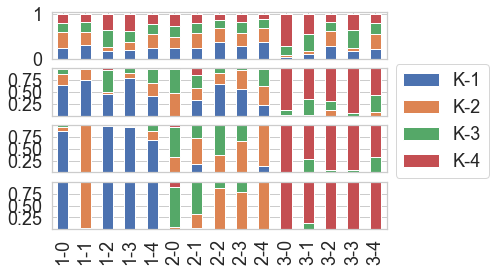

In [57]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

# Set up the matplotlib figure
f, ax = plt.subplots(4, 1, sharex=True)

for iC, (key, val) in enumerate(df_w.items()):
    _ = val.plot.bar(stacked=True, ax=ax[iC], legend=False)

handles, labels = ax[0].get_legend_handles_labels()
# f.legend(handles, labels, loc='center right')
_ =f.legend(handles, labels, loc='center left', bbox_to_anchor=(0.9, 0.5), fontsize=18)
_ =plt.xticks(fontsize=18)
f.savefig(f'{dir_plot}/Test_weights_barplot_K{nC}.png', dpi=500)


Plot weights in HBM-Clus+ over different cases

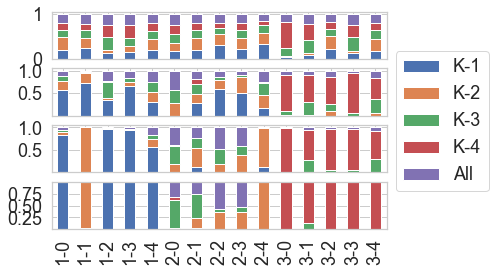

In [58]:
dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

col_order = [f'K-{x+1}' for x in range(nC)] + ['All']

# Set up the matplotlib figure
f, ax = plt.subplots(4, 1, sharex=True)

for iC, (key, val) in enumerate(df_w_ex.items()):
    tmp_val = val[col_order]
    _ = tmp_val.plot.bar(stacked=True, ax=ax[iC], legend=False)

handles, labels = ax[0].get_legend_handles_labels()
# f.legend(handles, labels, loc='center right')
_ =f.legend(handles, labels, loc='center left', bbox_to_anchor=(0.9, 0.5), fontsize=18)
_ =plt.xticks(fontsize=18)
f.savefig(f'{dir_plot}/Test_weights_ex_barplot_K{nC}.png', dpi=500)


Generate site-specific data samples with HBM-Gibbs

In [126]:
%%time

N_burn_h=1000
del_t_h=10

Nt = 21
del_t = 1
N_burn = 20

rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2 ** 32 - 1, size=len(data_idx))

x_samples_all = []
for iD, d_idx in enumerate(data_idx):
#     d_idx = data_idx[0]

    tmp_data_df = x_test_df.drop(['label'], axis=1)

    x_S = []
    for key, val in site_labels.items():
        x_S.append(tmp_data_df.loc[val,:].values[d_idx,:])

    x_samples_all.append(
        prd_hbm['All'].gen_x_samples(
            x_S=x_S, N_burn=N_burn, del_t=del_t, Nt=Nt, rand_seed=rand_seeds[iD], N_burn_h=N_burn_h, del_t_h=del_t_h))
    

CPU times: user 8min 36s, sys: 945 ms, total: 8min 37s
Wall time: 8min 38s


In [ ]:
dir_save = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'

with open(f'{dir_save}/Test_x_samples_all.pkl', 'wb') as f:
    pk.dump(x_samples_all, f)
    

Generate site-specific data samples with HBM-Clus

In [59]:
%%time

N_burn_h=1000
del_t_h=10

Nt = 21
del_t = 1
N_burn = 20

rand_seed = 202111

np.random.seed(rand_seed)
rand_seeds = np.random.randint(0, 2 ** 32 - 1, size=len(data_idx))

x_samples_clus = []
for iD, d_idx in enumerate(data_idx):
#     d_idx = data_idx[0]

    tmp_data_df = x_test_df.drop(['label'], axis=1)

    x_S = []
    for key, val in site_labels.items():
        x_S.append(tmp_data_df.loc[val,:].values[d_idx,:])

    tmp_w = df_w[case_names[iD]]
    tmp_x_samples = []
    for iC in tmp_w.columns.values:
        tmp_x_samples.append(prd_hbm[iC].gen_x_samples(
            x_S=x_S, N_burn=N_burn, del_t=del_t, Nt=Nt, rand_seed=rand_seeds[iD], N_burn_h=N_burn_h, del_t_h=del_t_h))
        
    x_samples_clus.append([])
    for iR in range(tmp_w.shape[0]):
        tmp_all_s = []
        tmp_all_w = []
        for iC, val in enumerate(tmp_x_samples):
            if len(tmp_all_w) == 0:
                tmp_all_s = val[iR]
                tmp_all_w = np.repeat(tmp_w.iloc[iR, iC]/val[iR].shape[0], val[iR].shape[0])
            else:
                tmp_all_s = np.concatenate([tmp_all_s, val[iR]], axis=0)
                tmp_all_w = np.concatenate([tmp_all_w, np.repeat(tmp_w.iloc[iR, iC]/val[iR].shape[0], val[iR].shape[0])], axis=0)
                
        x_samples_clus[-1].append(
            tmp_all_s[np.random.choice(tmp_all_s.shape[0], size=int(tmp_all_s.shape[0]/len(tmp_x_samples)), p=tmp_all_w),:])
    

CPU times: user 35min 13s, sys: 6.71 s, total: 35min 20s
Wall time: 35min 24s


In [60]:
dir_save = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'
    
with open(f'{dir_save}/Test_x_samples_clusters_K{nC}.pkl', 'wb') as f:
    pk.dump(x_samples_clus, f)
    

### Plotting and results analysis for HBM_Clus

Load the site specific data samples from HBM-Gibbs & HBM-Clus

In [62]:
dir_load = 'Data/SynData_Cluster_D2_Str202111_Ste20211100'
nC_list = [2, 3, 4]

with open(f'{dir_load}/Test_x_samples_all.pkl', 'rb') as f:
    x_samples_all = pk.load(f)

x_samples_clus = {}
for nC in nC_list:
    with open(f'{dir_load}/Test_x_samples_clusters_K{nC}.pkl', 'rb') as f:
        x_samples_clus[f'K{nC}'] = pk.load(f)
    

Plot site data for HBM-Gibbs

/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


CPU times: user 24 s, sys: 708 ms, total: 24.7 s
Wall time: 24.7 s


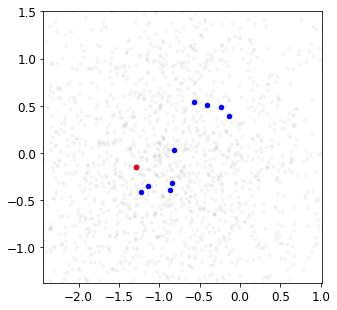

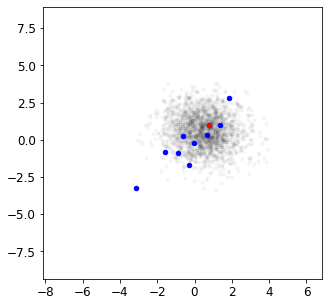

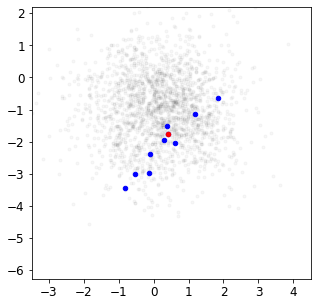

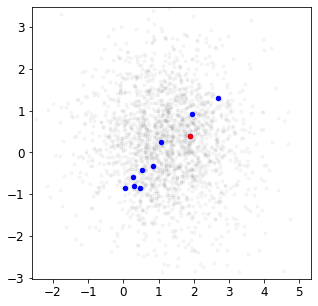

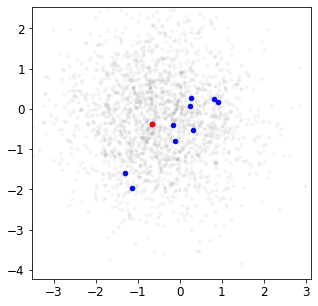

...

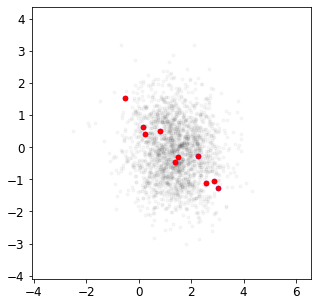

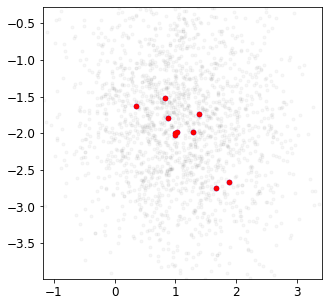

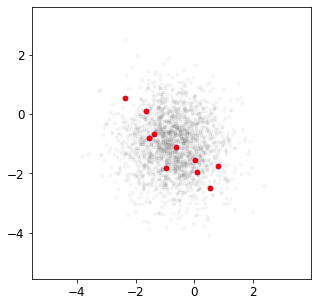

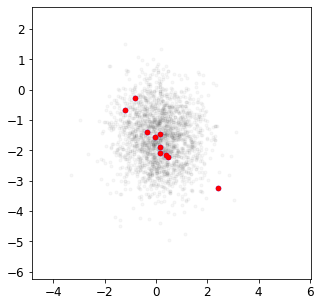

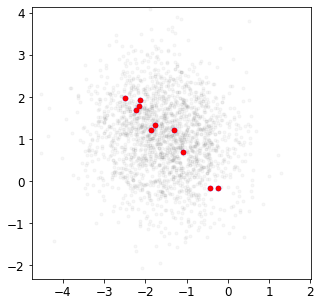

In [171]:
%%time

site_keys = list(site_labels.keys())

v_alpha = 0.03
dot_size = 10

# case_text = ['1data', '2data', '3data', '5data']

for ii, x_samples in enumerate(x_samples_all):
    dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}/Test_all_{case_names[ii]}'
    os.makedirs(dir_plot, exist_ok=True)

    for iS, x_tmp in enumerate(x_samples):
        x_test_tmp = x_test_df.drop(['label'], axis=1).loc[site_labels[site_keys[iS]],:].values

        for i1 in range(x_tmp.shape[1]-1):
            for i2 in range(i1+1,x_tmp.shape[1]):
                
                x_max = x_test_tmp[:,[i1,i2]].max(axis=0)
                x_min = x_test_tmp[:,[i1,i2]].min(axis=0)
                x_del = x_max - x_min
                xy_max = (x_max + x_del*1)
                xy_min = (x_min - x_del*1)
                
                plt.figure(figsize=(5,5))
                _ = plt.scatter(x_tmp[:,i1], x_tmp[:,i2], s=dot_size, c='k', alpha=v_alpha)
                _ = plt.scatter(x_test_tmp[:, i1], x_test_tmp[:, i2], s=dot_size*2, c='b')
                _ = plt.scatter(x_test_tmp[data_idx[ii], i1], x_test_tmp[data_idx[ii], i2], s=dot_size*2, c='r')
                plt.xticks(fontsize= 12)
                plt.yticks(fontsize= 12)
                plt.xlim([xy_min[0], xy_max[0]])
                plt.ylim([xy_min[1], xy_max[1]])
                plt.savefig(f'{dir_plot}/{site_keys[iS]}_rho{i1}-{i2}.png', dpi=500)


Plot site data for HBM-Clus

/opt/miniconda3/envs/MB16_xepy37_v06_test_env/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


CPU times: user 21.4 s, sys: 653 ms, total: 22.1 s
Wall time: 22.1 s


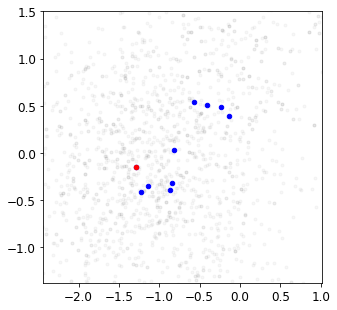

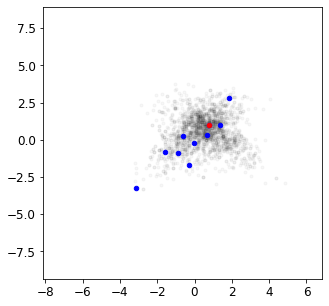

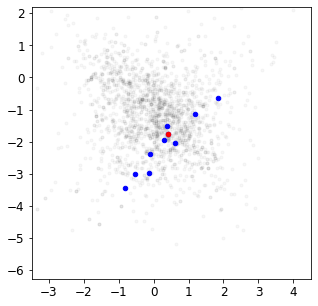

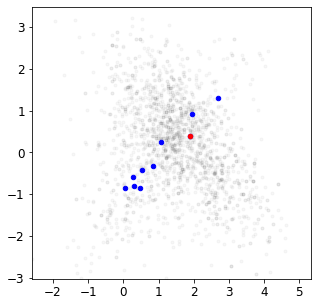

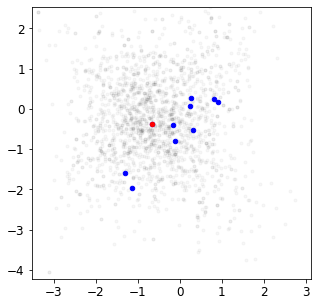

...

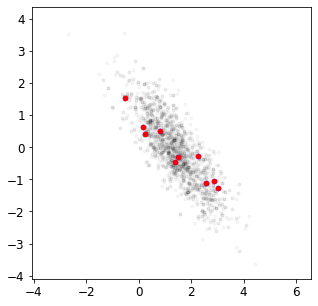

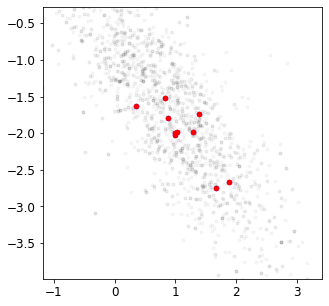

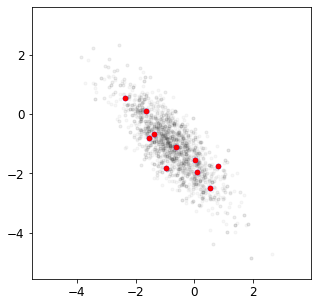

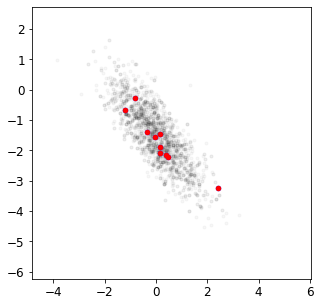

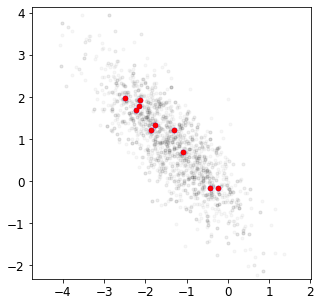

In [172]:
%%time

site_keys = list(site_labels.keys())

v_alpha = 0.03
dot_size = 10
nC_plot = 3

# case_text = ['1data', '2data', '3data', '5data']

for ii, x_samples in enumerate(x_samples_clus[f'K{nC_plot}']):
    dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}/Test_clusters_{case_names[ii]}'
    os.makedirs(dir_plot, exist_ok=True)

    for iS, x_tmp in enumerate(x_samples):
        x_test_tmp = x_test_df.drop(['label'], axis=1).loc[site_labels[site_keys[iS]],:].values

        for i1 in range(x_tmp.shape[1]-1):
            for i2 in range(i1+1,x_tmp.shape[1]):
                
                x_max = x_test_tmp[:,[i1,i2]].max(axis=0)
                x_min = x_test_tmp[:,[i1,i2]].min(axis=0)
                x_del = x_max - x_min
                xy_max = (x_max + x_del*1)
                xy_min = (x_min - x_del*1)
                
                plt.figure(figsize=(5,5))
                _ = plt.scatter(x_tmp[:,i1], x_tmp[:,i2], s=dot_size, c='k', alpha=v_alpha)
                _ = plt.scatter(x_test_tmp[:, i1], x_test_tmp[:, i2], s=dot_size*2, c='b')
                _ = plt.scatter(x_test_tmp[data_idx[ii], i1], x_test_tmp[data_idx[ii], i2], s=dot_size*2, c='r')
                plt.xticks(fontsize= 12)
                plt.yticks(fontsize= 12)
                plt.xlim([xy_min[0], xy_max[0]])
                plt.ylim([xy_min[1], xy_max[1]])
                plt.savefig(f'{dir_plot}/{site_keys[iS]}_rho{i1}-{i2}.png', dpi=500)


Calculate likelihood metric for performance evaluation

In [74]:
# get likelihood for each specific case

mu_test_concat = np.concatenate(mu_test, axis=0)
C_test_concat = np.concatenate(C_test, axis=0)

test_likelihood = {key: pd.DataFrame(index=val.index, columns=['HBM-Gibbs'] + [f'HBM-Clus_K{nC}' for nC in nC_list]) for key, val in df_w.items()}

for iC, (iCase, _) in enumerate(df_w.items()):
    for ii, mu in enumerate(mu_test_concat):
        test_likelihood[iCase].iloc[ii, 0] = multivariate_normal.logpdf(x_samples_all[iC][ii], mean=mu, cov=C_test_concat[ii,:,:]).sum()
        for iK, nC in enumerate(nC_list):
            test_likelihood[iCase].iloc[ii, 1+iK] = multivariate_normal.logpdf(x_samples_clus[f'K{nC}'][iC][ii], mean=mu, cov=C_test_concat[ii,:,:]).sum()
    

In [64]:
# get likelihood difference between HBM-Clus and HBM-Gibbs

test_likelihood_diff = {}
for nC in nC_list:
    test_likelihood_diff[f'K{nC}'] = []
    for key, val in test_likelihood.items():
        test_likelihood_diff[f'K{nC}'].append(val[f'HBM-Clus_K{nC}'] - val['HBM-Gibbs'])
    test_likelihood_diff[f'K{nC}'] = pd.concat(test_likelihood_diff[f'K{nC}'], axis=1)
    test_likelihood_diff[f'K{nC}'].columns = test_likelihood.keys()
    
test_likelihood_diff


{'K2':             1data         3data         5data        10data
 1-0   4203.302803  14466.554465  16383.645474  16429.054806
 1-1   1477.854991   4050.726535   4439.747643   4253.896211
 1-2  -7212.092158   4950.073501  13844.958438  12504.265521
 1-3     670.73171  15718.759428  14511.076121  13216.616933
 1-4   2476.885126   6954.046201   8645.951525    6989.10333
 2-0   -956.314035   -122.617344    945.657971    797.709667
 2-1    457.199131    761.579754    775.730651    729.921805
 2-2   -466.453069   -511.219346    103.177017     11.055573
 2-3    -93.023733   -234.850094    -36.921908   -227.594483
 2-4    187.630762    142.796039    208.026745    256.241837
 3-0  10295.543093   9605.736769   9038.770681    8919.48657
 3-1   8802.211623  10559.595726   8046.647199    8671.62901
 3-2  -3920.326288   6103.441442    5502.10526   5949.343509
 3-3   6012.161549   8989.839606   7335.616672   7106.151389
 3-4  -6269.408846  17891.146525  19446.540521   18450.85533,
 'K3':           

<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

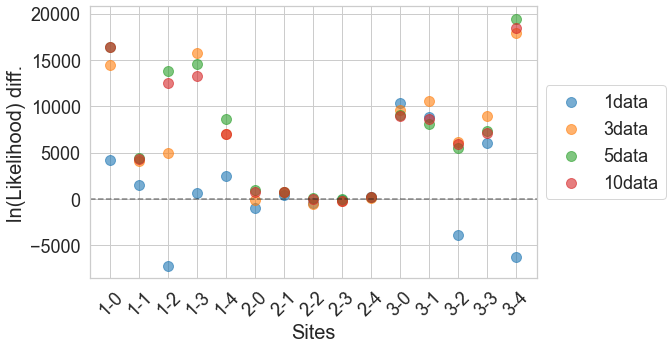

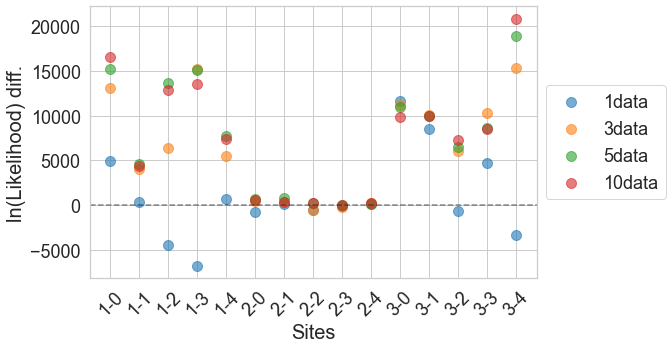

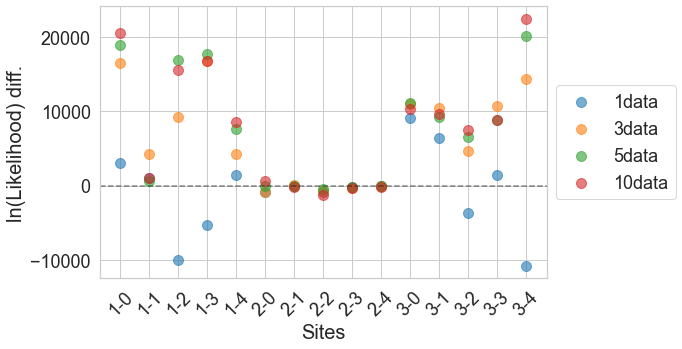

In [65]:
# plot results for fixed number of cluster

dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

for nC in nC_list:
    dot_size = 100
    c_list = sns.color_palette("tab10")[:test_likelihood_diff[f'K{nC}'].shape[1]]

    plt.figure(figsize=(8,5))
    for ii, (key, val) in enumerate(test_likelihood_diff[f'K{nC}'].iteritems()):
        _ = plt.scatter(val.index.values, val.values, s=dot_size, c=c_list[ii], label=key, alpha=0.6)

    _ =plt.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    _ =plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=18)
    _ =plt.xticks(fontsize=18, rotation=45)
    _ =plt.yticks(fontsize=18)
    _ =plt.xlabel('Sites', fontsize=20)
    _ =plt.ylabel('ln(Likelihood) diff.', fontsize=20)
    _ =plt.savefig(f'{dir_plot}/result_loglikelihood_K{nC}.png', dpi=500)


<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<Figure size 576x360 with 0 Axes>

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


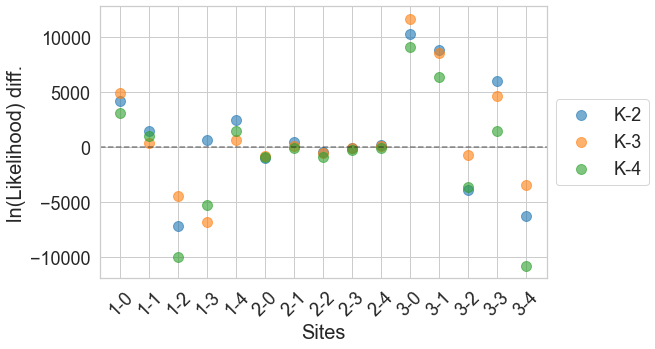

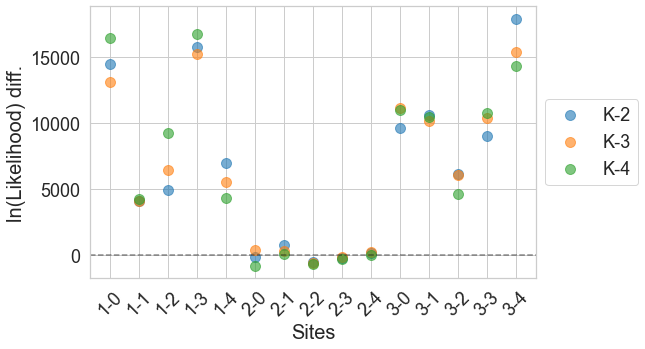

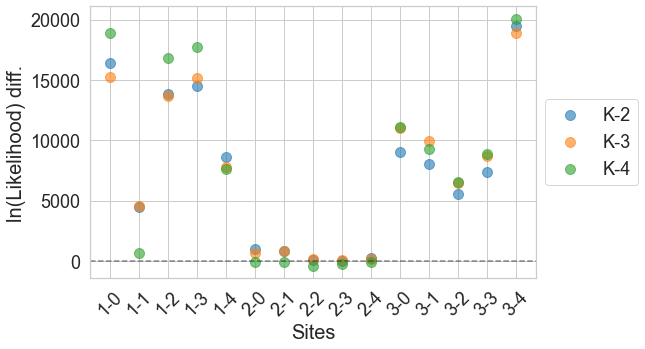

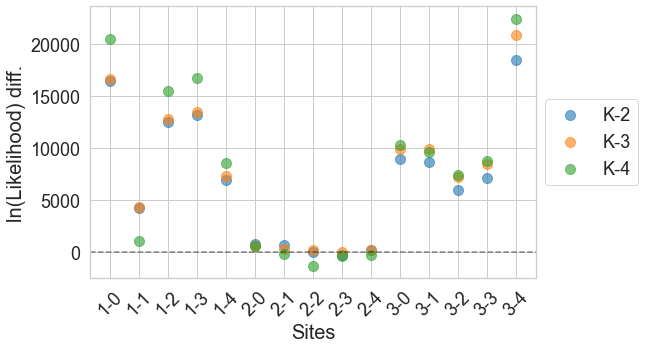

In [73]:
# plot results for fixed test case

dir_plot = f'HBM_plots/Synthetic_test_Cluster_D{N_dim_true}'
os.makedirs(dir_plot, exist_ok=True)

dot_size = 100
c_list = sns.color_palette("tab10")[:len(test_likelihood_diff)]

for c_name in test_likelihood_diff['K3'].columns.values:
    plt.figure(figsize=(8,5))
    for iK, nC in enumerate(nC_list):
        val = test_likelihood_diff[f'K{nC}'][c_name]
        _ = plt.scatter(val.index.values, val.values, s=dot_size, c=c_list[iK], label=f'K-{nC}', alpha=0.6)

    _ =plt.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    _ =plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=18)
    _ =plt.xticks(fontsize=18, rotation=45)
    _ =plt.yticks(fontsize=18)
    _ =plt.xlabel('Sites', fontsize=20)
    _ =plt.ylabel('ln(Likelihood) diff.', fontsize=20)
    _ =plt.savefig(f'{dir_plot}/result_loglikelihood_{c_name}.png', dpi=500)
